Matthew, Olivia, Ali and Harrison. June 2021

# Background on Density Ratios: Why are They Useful?

Density ratios $r(x)$ have been used throughout statistics and machine learning. Suppose we have two distributions of a random variable $x$: $p(x)$ and $q(x)$. The density ratio of these distributions is 
$$ r(x) = \frac{p(x)}{q(x)}$$
This ratio is very useful, since it tells us the amount by which we need to correct $q$ for it to be equal to $p$, since $p(x) = r(x) q(x)$. Also, recall that the first thing learned in Bayesian statistics is Bayes' Theorem, which uses such a ratio to compute the conditional probability
$$ p(y|x) = \frac{p(x,y)}{p(x)}$$
Many other ideas in statistics, such as the KL divergence, importance sampling, mutual information and hypothesis testing also make use of such ratios.

In simple probelms, we can compute the the numerator and the denomenator separately, and thus be able to compute the ratio. However, in complex problems like we have, direct evaluation of the densities will often not be possible, since the densities might not have an analytical form, and they might involve intractable integrals. 

We can use the density ratio trick, which is described in more detail below, to compute the density ratio without having to know $p(x)$ or $q(x)$ directly. In what follows, we show that
$$r(x)=\frac{p(x)}{q(x)}=\frac{\mathcal{d}(x)}{1-\mathcal{d}(x)}$$

Where $d(x)$ is a classifier that discriminates between the two distributions.

# Using Discriminator for Inference

A discriminator is a classifier that tries to learn the class, doesn't learn the underlying distribution. The output of a discriminator is $P(y=1 \mid x)$

$$P(y=1 \mid x)=\frac{P(x \mid y=1) P(y=1)}{P(x \mid y=0) P(y=0)+P(x \mid y=1) P(y=1)}$$ 
If we have evenly distributed data between two classess, i.e. 
$$P(y=1)=P(y=0)=0.5 $$
We can see that the priors cancel, and so
$$P(y=1 \mid x)=\frac{P(x \mid y=1)}{P(x \mid y=0) + P(x \mid y=1)} \\$$
After a little bit of rearranging we can write this as a sigmoid with some log ratio in the sigmoid
$$P(y=1 \mid x)=\frac{1}{1+\frac{P(x \mid y=0)}{P(x \mid y=1)}}=\frac{1}{1+\exp \left(\ln \frac{P(x \mid y=0)}{P(x \mid y=1)}\right)}$$


We see that the denominator is a sigmoid of a log ratio. This is output if we train a NN: $f(x)$
$\frac{1}{1+exp(-f(x))}$ Hence we have the equivalence



$$ \boxed{ P(y=1 \mid x)=\frac{1}{1+\frac{P(x \mid y=0)}{P(x \mid y=1)}} \Longleftrightarrow \frac{1}{1+\exp \left(\ln \frac{P(x \mid y=0)}{P(x \mid y=1)}\right)}  = P(y=1 \mid x) }$$

We thus have two probability distributions, each of which model the probability a certain number of infected counts, given parameters $\alpha$ and $\beta$. So we have $P_{data}(I_i(t_i) | \alpha, \beta, Y_0)$ and $P_{simulated}(I_i(t_i) | \alpha, \beta, Y_0)$, where $Y_0=[S_0, I_0, R_0]$ is the initial state vector of susceptible, infected and recovered persons, respectively. We want to compute the posterior $P(\alpha, \beta| I_i(t_i) )$. (There is a question of whether the initial conditions should be the same in both the real and fake data cases.) This is the conditional probability that will be modified by our machine learning model to achieve the correct probability distribution. 

## References
* Pattern Recognition and Machine Learning, Bishop, Christopher M., 2006.



---


# Application to SIR Model: Posterior probability and inferences on $\alpha$ and $\beta$ using a machine learning Discriminant model

We want want a machine learning classifier to separate signal $P_{data}(I)$ to background $P_{simulated}(I)$, i.e. we want a function $d(\vec{x}): X \rightarrow Y$ that maps the signal to $y=1$, and background to $y=0$. We should therefore find a finction $d(\vec{x})$ that minimizes the loss function.

i.e. we want to approximate the optimal classifier 
$$d(x)=\frac{p_{data}\left(I | y; \alpha, \beta, Y_0 \right)}{p_{data}\left(I | y; \alpha, \beta, Y_0 \right)+p_{simulated}\left(I | y; \alpha, \beta, Y_0 \right)}$$

Where
$$p_{data}\left(I | \alpha, \beta, Y_0 \right) = (I|y=1; \alpha, \beta, Y_0)$$

$$p_{simulated}\left(I | \alpha, \beta, Y_0 \right) = \underbrace{p(I|y=0; \alpha, \beta, Y_0)}_{\text{prob. distribution of background class, which is parameterized by $\alpha, \beta, Y_0$}}$$

This classifier is 1-to-1 with the density ratio 
$$r=\frac{p_{data}(I |y; \alpha, \beta, Y_0)}{p_{simulated}(I |y; \alpha, \beta, Y_0)} $$

So we may write the classifier in terms of the density ratio
$$d(x)=\frac{p_{data}\left(I|y; \alpha, \beta, Y_0) \right)}{p_{data}\left(I |y;  \alpha, \beta, Y_0 \right)+p_{simulated}\left(I |y; \alpha, \beta, Y_0 \right)} = \frac{r(I ; \alpha, \beta, Y_0)}{1+r(I ; \alpha, \beta, Y_0)}$$

**Proof**:
$$ 
r(x)=\frac{p(x)}{q(x)}=\frac{p(x \mid y=1)}{p(x \mid y=0)}$$ 

$$=\frac{p(y=1 \mid x) p(x)}{p(y=1)} / \frac{p(y=0 \mid x) p(x)}{p(y=0)}$$

$$=\frac{p(y=1 \mid x)}{p(y=0 \mid x)}=\frac{p(y=1 \mid x)}{1-p(y=1 \mid x)}=\frac{d(x)}{1-d(x)}$$

---
Hence we can write the density ratio of infected counts
$$r(I) =\frac{p_{data}(I |y; \alpha, \beta, Y_0)}{p_{simulated}(I |y; \alpha, \beta, Y_0)} =\frac{d(I ; \alpha, \beta, Y_0)}{1-d(I ; \alpha, \beta, Y_0)} $$

Thus we want to arrive at the discriminator $d(x)$ that discriminates between $p_{data}(I | \alpha, \beta, Y_0)$ and $p_{simulated}(I | \alpha, \beta, Y_0)$. Then, rhis ratio, which will estimate the ratio of the two class joint probability distributions ($r=\frac{P_1}{P_1 +P_0}$).

However, now, class 0 ($P_0$ is the "fake" or "simulated" data) will be split into a Poisson prior and the conditional probability that we have chosen, i.e. for each sample we have chosen $I_{mean} = \bar{I_i}$ where $I_i$ are the solutions to the ODE to generate class 0, and we generated class 0 as a poisson distribution given this mean, i.e.
$$y_i|I_{i,mean} \sim Pois(I_{i, mean})$$ Where $I_{i, mean} = E[I_i]$. Since we did this for all the samples and each sample depended on the distributions of $\alpha$ and $\beta$, we can write the final distribution of everything for class 0 as a heirarchical model:
$$P_{simulated}(I_1, ..., I_N, \alpha, \beta) = P(I_1, ..., I_N|\alpha, \beta) \ P(\alpha|\alpha_0)\  P(\beta|\beta_0) \times \frac{d}{1-d}$$

Hence
$$P_{simulated}(I_1, ..., I_N, \alpha, \beta) = \Pi_{i=0}^N \left[ Pois(I_i|\alpha, \beta) \right] \times Pois(\alpha|\alpha_0) \ \times \ Pois(\beta|\beta_0) \times \frac{d}{1-d} $$

After going through the entire chain, we arrive at an approximate probability distribution, which approximates the true probability distribution for the counts, i.e. we perform an approximate inference of the counts $I_i$: $P(I_i, ..., I_N, \alpha, \beta)$


I propose to change the naming of the two classes to signal (from stochastic solution) and background (from ODE), to avoid confusion in the jargon.

Using the equations above, the predicted posterior distribution for the infected counts would thus be
$$P(I_1, ..., I_N, \alpha, \beta) = \Pi_{i=0}^N \left[ Pois(\{I_1^{Bkg}, I_2^{Bkg}, I_N^{Bkg} \}|\alpha, \beta) \right] \times Pois(\alpha|\alpha_0) \ \times \ Pois(\beta|\beta_0) \times \frac{d}{1-d} $$
Where $Bkg$ referes to "Background", ie samples generated with the ODE method.

Thus in this fashion we have generated an example of an implicit probabilistic model, which has the advantage of being able to model more complicated distributions, such as the the ones for SIR. Other advantages of implicit models are that  we can sample from easily, and which we can take derivatives of with respect to its parameters. 

Hence this notebook will take from the previous chain of notebooks for this project. We will use the procedure described above to: 
* Train a classifier model, fit the model to the data and targets 
* Predict the targets 
* tune hyperparameters
* Explore the model performance's dependence on different Loss functions
* Explore different classifier models, such as ConvNNs, ResNets, etc.
* Save our best performing trained model, to be used later by a different notebook.

The workflow chain for this project is illustrated by the animated graphic below.

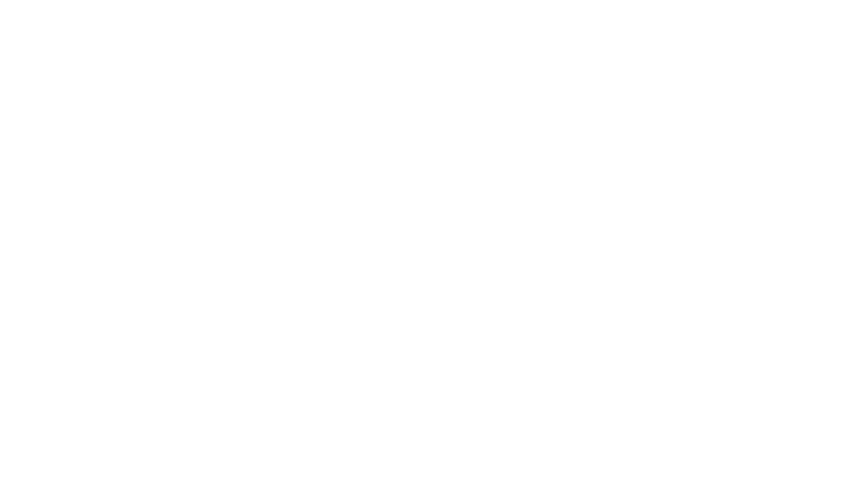

## Start by loading the project repository

In [3]:
import os
path = '/content/SIRLikelihood/'
isFile = os.path.isdir(path) 
if isFile == True:
  !rm -r /content/SIRLikelihood/

!git clone https://github.com/egonspin/SIRLikelihood 

Cloning into 'SIRLikelihood'...
remote: Enumerating objects: 76, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 76 (delta 33), reused 49 (delta 15), pack-reused 0
Unpacking objects: 100% (76/76), done.


## Import the necessary libraries
We will be using pytorch for all our ML work, in addition to scipy/numpy/pandas/matplotlib stack. Also, we will be using Optuna for Hyperparameter tuning. If you dont have a packed, install it with pip

In [5]:
!pip install optuna
#!pip install torch

     |████████████████████████████████| 307kB 20.8MB/s 
     |████████████████████████████████| 81kB 12.4MB/s 
     |████████████████████████████████| 174kB 41.6MB/s 
     |████████████████████████████████| 112kB 55.7MB/s 
     |████████████████████████████████| 51kB 8.7MB/s 
     |████████████████████████████████| 143kB 51.9MB/s 
     |████████████████████████████████| 81kB 12.9MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-cp37-none-any.whl size=11136 sha256=25d20b85c6c7efca70e5a20b452d6abe5e5335cd82e453f6cc655fe7dca6842e
  Stored in directory: /root/.cache/pip/wheels/25/af/b8/3407109267803f4015e1ee2ff23be0c8c19ce4008665931ee1
Successfully built pyperclip


In [1]:
import numpy as np
import torch.nn as nn
from torch.autograd import Variable
import scipy as sp

import pandas as pd
import copy

import torch
import optuna

import matplotlib as mp
import matplotlib.pyplot as plt
# force inline plots
%matplotlib inline
plt.style.use('seaborn-deep')

# import torch.multiprocessing
# torch.multiprocessing.set_sharing_strategy('file_system')

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [2]:
# update fonts
FONTSIZE = 12
font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : FONTSIZE}
mp.rc('font', **font)

# set a seed to ensure reproducibility
seed = 128
rnd  = np.random.RandomState(seed)
#If you just cloned the repo and you're outside the directory, use BASE = 'SIRLikelihood/' 
BASE = 'SIRLikelihood/'

# Explaratory Data Analysis

We have two classes, class with target 0 is the "fake" data, and class with target 1 is the "real" data. Each row represents a simulation of an epidemic, with 13 infected counts $\{ I \}$. Please observe the dataframe blow

In [8]:
import pandas as pd; import numpy as np
df = pd.read_csv(BASE +'CompleteDataframe.csv')#SIRLikelihood/CompleteDataframe.csv
df.drop(df.columns[[0]], axis=1, inplace=True)
df.head(-10)

,Infected,alpha,beta,i0,r0,s0,time,Target
0,[ 4 12 23 65 99 154 147 166 151 94 83 ...,0.530194,0.001749,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
1,[ 5 19 56 111 199 240 196 148 101 59 51 ...,0.538565,0.002075,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
2,[ 2 139 447 387 232 167 92 59 52 11 11 ...,0.488867,0.003501,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
3,[3 0 1 0 0 0 0 0 0 0 0 0 0],0.877830,0.000049,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
4,[ 1 79 218 390 368 342 235 186 130 94 61 ...,0.339035,0.002534,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
...,...,...,...,...,...,...,...,...
99985,[ 3. 5. 5. 8. 9. 13. 18. 31. 42. ...,0.206270,0.000921,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99986,[3. 1. 2. 3. 2. 1. 2. 1. 2. 1. 0. 0. 0.],0.598765,0.000321,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99987,[ 3. 20. 32. 48. 88. 110. 120. 149. 123. ...,0.613023,0.001764,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99988,[3. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],0.565252,0.000615,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0


In [ ]:
df.describe()

,alpha,beta,i0,r0,s0,Target
count,100000.000000,100000.000000,100000.0,100000.0,100000.0,100000.000000
mean,0.465792,0.002368,3.0,0.0,763.0,0.500000
std,0.265182,0.001354,0.0,0.0,0.0,0.500003
min,0.004671,0.000024,3.0,0.0,763.0,0.000000
25%,0.236143,0.001191,3.0,0.0,763.0,0.000000
50%,0.467238,0.002370,3.0,0.0,763.0,0.500000
75%,0.694420,0.003543,3.0,0.0,763.0,1.000000
max,0.925343,0.004716,3.0,0.0,763.0,1.000000


### Interact with the dataframe with widgets

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output

def unique_targets(array):
    #np.unique returns the unique elements in an array 
    unique = array.unique().tolist()
    unique.sort()
    return unique

unique_targets(df.Target)

[0.0, 1.0]

In [ ]:
#create a drop down button for choosing the different types of targets
dropdown = widgets.Dropdown(options=unique_targets(df.Target) )

def targets_display(change):
    with out:
        clear_output()
        display(df[df.Target == change.new])

#make a dropdown button that you can change based on targets column
out = widgets.Output()
dropdown.observe(targets_display, names='value')
display(dropdown)
display(out)

Dropdown(options=(0.0, 1.0), value=0.0)

Output()

In [ ]:
from ipywidgets import interact
@interact
def interact_with_columns(column=['alpha', 'beta', 'Target'], x = (0,1, 0.001) ):
    return df.loc[df[column] > x]


interactive(children=(Dropdown(description='column', options=('alpha', 'beta', 'Target'), value='alpha'), Floa…

## Let's see how the distribution differs between the two classes

In [ ]:
def plot_data_from_df(df, N=8000, nbins=50):
    
    # divide data into 
    # those with target == 1 and 
    # those with target == 0.
    sig = df[df.Target > 0.5][:N]
    bkg = df[df.Target < 0.5][:N]
    
    # create an empty figure
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(10,10))
  
    ax1.set_xlabel(r'$\alpha$', fontsize=FONTSIZE)
    ax1.set_xlim((0,1))
    
    ax1.hist(sig.alpha, bins=nbins, range=(0,1),
            color='b', alpha=0.3, label='$t = 1$')
    
    ax1.hist(bkg.alpha, bins=nbins, range=(0,1),
            color='r', alpha=0.3, label='$t = 0$')
    
    ax1.grid(True, which="both", linestyle='-')  
    ax1.legend(loc='upper right')

    #beta
    ax2.set_xlabel(r'$\beta$', fontsize=FONTSIZE)
    ax2.set_xlim((0,0.006))
    
    ax2.hist(sig.beta, bins=nbins, range=(0,0.006),
            color='b', alpha=0.3, label='$t = 1$')
    
    ax2.hist(bkg.beta, bins=nbins, range=(0,0.006),
            color='r', alpha=0.3, label='$t = 0$')
    
    ax2.grid(True, which="both", linestyle='-')  
    ax2.legend(loc='upper right')

    #infected counts
    # ax3.set_xlabel(r'$I$', fontsize=FONTSIZE)
    # ax3.set_xlim((0,300))
    
    # ax3.hist(sig.Infected.values, bins=nbins, range=(0,300),
    #         color='b', alpha=0.3, label='$t = 1$')
    
    # ax3.hist(bkg.Infected.values, bins=nbins, range=(0,300),
    #         color='r', alpha=0.3, label='$t = 0$')
    
    # ax3.grid(True, which="both", linestyle='-')  
    # ax3.legend(loc='upper right')



    plt.show()


In [ ]:
df.Infected[0]

'[  4  12  23  65  99 154 147 166 151  94  83  71  54]'

In [ ]:
# df.Infected[0].lstrip('\'[').rstrip('\']').replace(' ', ',')

In [ ]:
# [df.Infected[i].lstrip("[").lstrip("'").rstrip("]").rstrip("'").replace(' ', ',') for i in range(len(df.Infected))]

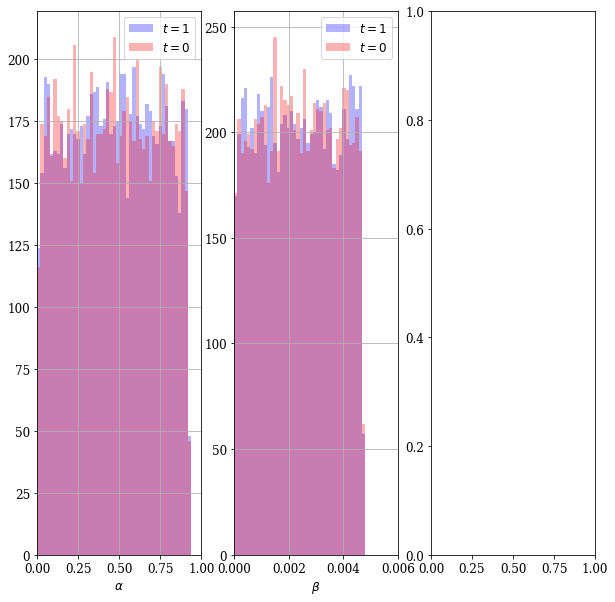

In [ ]:
plot_data_from_df(df)

## Switch to using the data in numpy format, load data.npy

In [5]:
from numpy import load
io = load(BASE + 'data.npy')
io

array([[9.23604299e-01, 4.14983696e-04, 3.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [1.12132255e-01, 1.98534526e-03, 7.00000000e+00, ...,
        3.15000000e+02, 2.75000000e+02, 0.00000000e+00],
       [5.43568098e-01, 2.41062888e-03, 3.00000000e+00, ...,
        2.70000000e+01, 1.10000000e+01, 1.00000000e+00],
       ...,
       [3.43152531e-01, 2.01679976e-03, 3.00000000e+00, ...,
        7.60000000e+01, 4.60000000e+01, 0.00000000e+00],
       [5.27124067e-01, 2.39336011e-03, 3.00000000e+00, ...,
        1.40000000e+01, 1.40000000e+01, 0.00000000e+00],
       [1.70410480e-01, 1.98850653e-03, 3.00000000e+00, ...,
        2.58000000e+02, 2.14000000e+02, 1.00000000e+00]])

This numpy array is much more conveniet to work with and faster. One can index it through **io[row number, column number]**

For example, we can access the $\alpha$ feature as the first column, and with selectring all the rows with ":",  i.e.

In [ ]:
io[:,0]

array([0.9236043 , 0.11213225, 0.5435681 , ..., 0.34315253, 0.52712407,
       0.17041048])

The last column of the array is the targets column, with 0 for background and 1 for signal

In [ ]:
io[:,-1]

array([1., 0., 1., ..., 0., 0., 1.])

## Discriminate between the two classes
Our ultimate goal is to model the likelihood data and put inferences and error bars on $\alpha$ and $\beta$. In order to simulate the data properly, and later compare the simulated data (which is solved using the ODE solution), to the "real" data, which is found using a stochastic model of the ODE and the actual counts, we must start with the same initial conditions as the real data.


Notice how difficult it seems to discriminate between $\alpha$ and $\beta$ of the two classes 

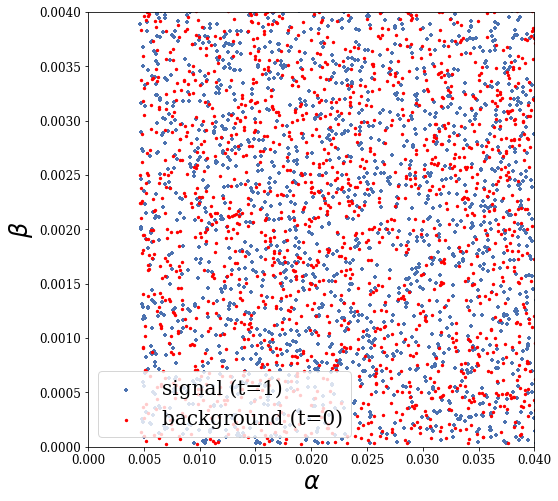

In [6]:
plt.rcParams["figure.figsize"] = (8,8)
#Define signal and background classes
sig = io[io[:, -1] > 0.5]
bkg = io[io[:, -1] < 0.5]

plt.xlabel(r'$\alpha$', fontsize=24)
plt.ylabel(r'$\beta$',fontsize=24)
plt.xlim([0, 0.04])
plt.ylim([0, 0.004])
plt.scatter(sig[:,0], sig[:,1], label='signal (t=1)', s=2, marker="P", linewidths =2)
plt.scatter(bkg[:,0], bkg[:,1], label='background (t=0)', c='r', s=2,  linewidths =2)
plt.legend(fontsize=20, loc='best')

Notice however that infected counts have a slightly more descenable discrimination surface. For example see below we plot the infeced counts on the second and third day

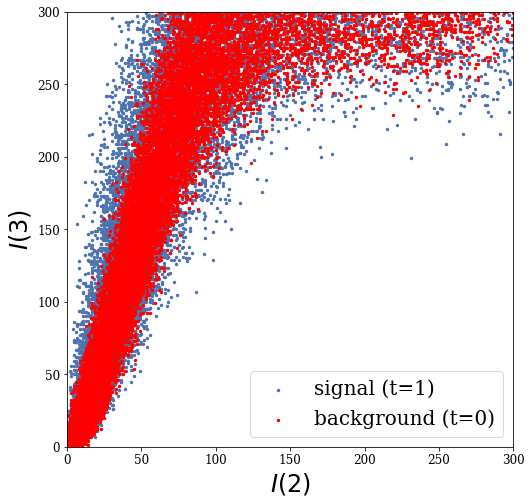

In [ ]:
plt.rcParams["figure.figsize"] = (8,8)

plt.xlim([0, 300])
plt.ylim([0, 300])
plt.xlabel(r'$I(2)$', fontsize=24)
plt.ylabel(r'$I(3)$',fontsize=24)
plt.scatter(sig[:,3], sig[:,4], label='signal (t=1)',  s=2, linewidths =2)
plt.scatter(bkg[:,3], bkg[:,4], label='background (t=0)', c='r', s=2, linewidths =2)
plt.legend(fontsize=20, loc='best')

In [ ]:
sig_data=sig[:,2:-1]; sig_data
bkg_data=bkg[:,2:-1]; bkg_data.shape

(50000, 13)

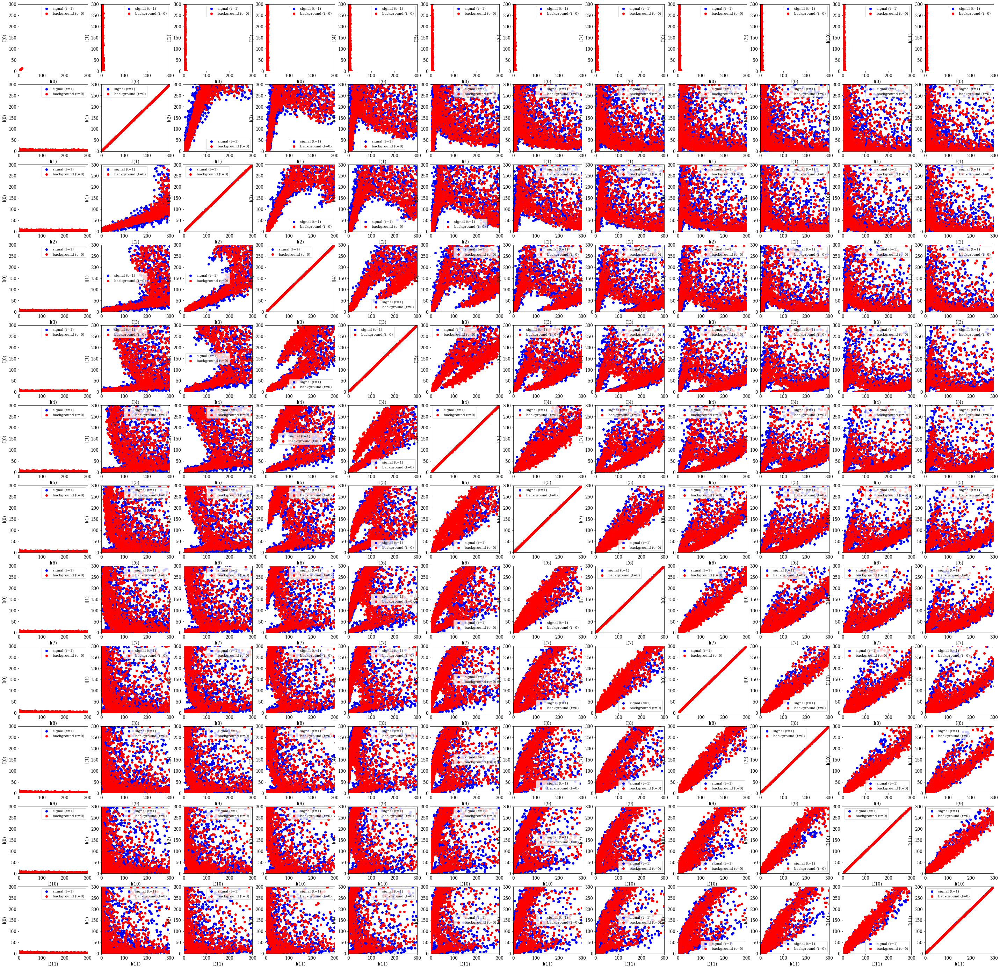

In [ ]:
fig, axes = plt.subplots(12,12, figsize=(50,50))
N=3000
for i in range(12):
    for j in range(12):
        axes[i,j].scatter(sig_data[:N,i], sig_data[:N, j], label='signal (t=1)', c='blue', linewidths =1)
        axes[i,j].scatter(bkg_data[:N,i], bkg_data[:N, j], label='background (t=0)', c='red', linewidths =1)
        axes[i,j].set_xlabel(r'I('+str(i)+')')
        axes[i,j].set_ylabel(r'I('+str(j)+')')
        axes[i,j].set_xlim([0, 300])
        axes[i,j].set_ylim([0, 300])
        axes[i,j].legend(fontsize=10, loc='best')

Define features, targets, number of samples and features (i.e. the dimensions of our data)

In [11]:
data = io[:, :-1]; #(features are everything but the last column)
targets = io[:,-1]; #Targets is the last column
n_samples, n_features = data.shape #it might be the case that this works even if X has time series column
n_samples, n_features #only infected array, alpha and beta

(100000, 15)

## Train Test Split
stratifying on the targets ensures a balanced proportion of the classes in the train and test sets

In [12]:
ntargets = 1
from sklearn.model_selection import train_test_split
train_data, test_data, train_targets, test_targets = train_test_split(data, 
                                                                      targets, 
                                                                      stratify=targets)
#Reshape the targets to have shape (something, 1)
train_targets = train_targets.reshape(-1,1)
test_targets = test_targets.reshape(-1,1)
test_targets

array([[0.],
       [0.],
       [1.],
       ...,
       [0.],
       [1.],
       [1.]])

## Check the mean and standard deviation of the training data

In [13]:
train_data.mean(), train_data.std()

(115.96416821742599, 171.1455318447515)

In [14]:
data = io[:, :-1]; #(features are everything but the last column)
targets = io[:,-1]; #Targets is the last column
n_samples, n_features = data.shape#it might be the case that this works even if X has time series column
n_samples, n_features #only infected array, alpha and beta

(100000, 15)

You can also use the data in pandas dataframe format (in Only run this if you want dataframe)

In [ ]:
import pandas as pd; import numpy as np
df = pd.read_csv(BASE+'CompleteDataframe.csv')
df.drop(df.columns[[0]], axis=1, inplace=True)
df.head(-10)

,Infected,alpha,beta,i0,r0,s0,time,Target
0,[ 4 12 23 65 99 154 147 166 151 94 83 ...,0.530194,0.001749,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
1,[ 5 19 56 111 199 240 196 148 101 59 51 ...,0.538565,0.002075,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
2,[ 2 139 447 387 232 167 92 59 52 11 11 ...,0.488867,0.003501,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
3,[3 0 1 0 0 0 0 0 0 0 0 0 0],0.877830,0.000049,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
4,[ 1 79 218 390 368 342 235 186 130 94 61 ...,0.339035,0.002534,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],0.0
...,...,...,...,...,...,...,...,...
99985,[ 3. 5. 5. 8. 9. 13. 18. 31. 42. ...,0.206270,0.000921,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99986,[3. 1. 2. 3. 2. 1. 2. 1. 2. 1. 0. 0. 0.],0.598765,0.000321,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99987,[ 3. 20. 32. 48. 88. 110. 120. 149. 123. ...,0.613023,0.001764,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0
99988,[3. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.],0.565252,0.000615,3.0,0.0,763.0,[ 0 2 3 4 5 6 7 8 9 10 11 12 13],1.0


In [ ]:
df.Infected[0]

'[  4  12  23  65  99 154 147 166 151  94  83  71  54]'

## Check the mean and standard deviation of the training data

In [15]:
train_data.mean(), train_data.std()

(115.96416821742599, 171.1455318447515)

## Standardize features by removing the mean (mean=0) and scaling to unit variance, this helps the training of our ML model by  tremendous amount

In [16]:
sc = StandardScaler()#this is always recommended for logistic regression
train_data= sc.fit_transform(train_data)
test_data = sc.transform(test_data)

## check again to make sure mean=0, std=1

In [17]:
train_data.mean(), (train_data.std())**2

(-1.9379816270278148e-15, 0.9999999999999376)

## Create Custom Dataset for our data
This takes the index for the data and target and gives dictionary of tensors of data and targets



In [18]:
class CustomDataset:
    def __init__(self, data, targets):
        self.data = data
        self.targets=targets
    def __len__(self):
        return self.data.shape[0]
    
    def __getitem__(self, idx):
        
        current_sample = self.data[idx, :]
        current_target = self.targets[idx]
        return {"x": torch.tensor(current_sample, dtype = torch.float),
               "y": torch.tensor(current_target, dtype= torch.float),
               }#this already makes the targets made of one tensor (of one value) each

## Create train and test custom datasets - which are made from the train and test datasets, respectively

In [19]:
train_dataset = CustomDataset(train_data, train_targets)
test_dataset = CustomDataset(test_data, test_targets)

## These custom datasets return a dictionary of samples "x" of length 15, and targets "y" of length 1 (either y=1 or y=0)

In [20]:
train_dataset[0]

{'x': tensor([-1.4748, -0.2527, -0.0026, -0.4351,  0.0474,  1.0623,  1.9740,  2.2717,
          2.3438,  2.3263,  2.3162,  2.2755,  2.2265,  2.1252,  1.9816]),
 'y': tensor([1.])}

In [21]:
train_targets.shape

(75000, 1)

## Create Train and Test DataLoaders
we now need the train data loader and the test data loader, choose the number of batch size, number of workers (cpu cores). Pass shuffle=True for the train_loader to get shuffled training data, do not shuffle the 

In [22]:

train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=10, 
                                           num_workers=2, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(test_dataset, 
                                          batch_size=10, num_workers=2)

In [23]:
train_loader

## Create an Engine Class. This takes the model and optimizer, and has functions that perform the training and evaluation on the dataloaders.

In [24]:
class Engine:
    """loss, training and evaluation"""
    def __init__(self, model, optimizer):
                 #, device):
        self.model = model
        #self.device= device
        self.optimizer = optimizer
        
    #the loss function returns the loss function. It is a static method so it doesn't need self
    @staticmethod
    def loss_fun(targets, outputs):
         return nn.BCEWithLogitsLoss()(outputs, targets)
#     This loss combines a Sigmoid layer and the BCELoss in one single class. This version is more numerically stable than using a plain Sigmoid followed by a BCELoss as, 
#     by combining the operations into one layer

    def train(self, data_loader):
        """the training function: takes the training dataloader"""
        self.model.train()
        final_loss = 0
        for data in data_loader:
            self.optimizer.zero_grad()
            inputs = data["x"]#.to(self.device)
            targets = data["y"]#.to(self.device)
            outputs = self.model(inputs)
            loss = self.loss_fun(targets, outputs)
            loss.backward()
            self.optimizer.step()
            final_loss += loss.item()
            return final_loss / len(data_loader)

    
    def evaluate(self, data_loader):
        """the training function: takes the training dataloader"""
        self.model.eval()
        final_loss = 0
        for data in data_loader:
            inputs = data["x"]#.to(self.device)
            targets = data["y"]#.to(self.device)
            outputs = self.model(inputs)
            loss = self.loss_fun(targets, outputs)
            final_loss += loss.item()
            return outputs
            #return final_loss / len(data_loader)
    
    
    ##HYPERPARAMETER TUNING WITH OPTUNA

# Create our model class

 This is where you explore your desired ML model architechture. This (below) is a fully connected neural deep network (MLP) with batch normalization, dropout and ReLU activation after each layer, and a linear layer at the end followed by a sigmoid to map it onto the range $[0,1]$

In [80]:
#explore different loss functions: whether it's better to use a loss function model output : 1. a/(a+b), 2. a/b, where a and ba re two classes

class Model(nn.Module):
    def __init__(self, nfeatures, ntargets, nlayers, hidden_size, dropout):
        super().__init__()
        layers = []
        for _ in range(nlayers):
            if len(layers) ==0:
                #inital layer has to have size of input features as its input layer
                #its output layer can have any size but it must match the size of the input layer of the next linear layer
                #here we choose its output layer as the hidden size (fully connected)
                layers.append(nn.Linear(nfeatures, hidden_size))
                #batch normalization
                layers.append(nn.BatchNorm1d(hidden_size))
                layers.append(nn.Dropout(dropout))
                #ReLU activation 
                layers.append(nn.ReLU())
            else:
                #if this is not the first layer (we dont have layers)
                layers.append(nn.Linear(hidden_size, hidden_size))
                layers.append(nn.BatchNorm1d(hidden_size))
                layers.append(nn.Dropout(dropout))
                layers.append(nn.ReLU())
                #output layer:
        layers.append(nn.Linear(hidden_size, ntargets)) 
        
        layers.append(nn.Sigmoid())
            #we have defined sequential model using the layers in oulist 
        self.model = nn.Sequential(*layers)
            
    
    def forward(self, x):
        return self.model(x)
    
    def forward_with_sigmoid(self, x):
        return self.sigmoid(self.forward(x))

In [79]:
# nfeatures = xtrain.shape[1],
# ntargets = ytrain.shape[1],
# nlayers = 2
# hidden_size=128,
# dropout=0.3
xtrain = train_data;  xtest = test_data
ytrain = train_targets;  ytest = test_targets
ytrain.shape

(75000, 1)

## Define your model, the number of features (here 15), number of targets=1, and choose the number of layers, hidden layers size and dropout

In [46]:
# #ytrain.view()
# ytrain= ytrain.reshape(-1,1)
#drop dropout after evaluating
# ytrain.shape
model =  Model(nfeatures=xtrain.shape[1], 
               ntargets=1,
               nlayers=5, 
               hidden_size=128, 
               dropout=0.3)
print(model)

Model(
  (model): Sequential(
    (0): Linear(in_features=15, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.3, inplace=False)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.3, inplace=False)
    (7): ReLU()
    (8): Linear(in_features=128, out_features=128, bias=True)
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): ReLU()
    (12): Linear(in_features=128, out_features=128, bias=True)
    (13): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): Dropout(p=0.3, inplace=False)
    (15): ReLU()
    (16): Linear(in_features=128, out_features=128, bias=True)
    (17): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_run

Choose Adam optimizer, define your Engine instance using the above model and optimizer. Start with a very high initial loss (infinity) and define an early stopping iterator (and counter) which stops the trainig after a specified number of steps if the loss is not decreasing. Define the number of epochs (note that the model will be trained on the entirety of the data in each epoch)

In [47]:
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

eng = Engine(model=model, optimizer = optimizer)
best_loss = np.inf
early_stopping_iter = 10
early_stopping_counter = 0
EPOCHS=22

## Training loop
Iterate only over the epochs, since the iteration of the data over the data loaders was already done in the engine class.

In [48]:
for epoch in range(EPOCHS):
    train_loss = eng.train(train_loader)
    test_loss = eng.train(test_loader)
    print("Epoch : %-10g, Training Loss: %-10g, Test Loss: %-10g" % (epoch, train_loss, test_loss))
    #print(f"{epoch}, {train_loss}, {test_loss}")
    if test_loss < best_loss:
        best_loss = test_loss
        
    else:
        early_stopping_counter += 1
    
    if early_stopping_counter > early_stopping_iter:
        #if we are not improving for 10 iterations then break the loop
        #we could save best model here
        break

Epoch : 0         , Training Loss: 8.92849e-05, Test Loss: 0.000280728
Epoch : 1         , Training Loss: 9.0139e-05, Test Loss: 0.000287012
Epoch : 2         , Training Loss: 0.000109648, Test Loss: 0.000268014
Epoch : 3         , Training Loss: 0.000101988, Test Loss: 0.000286592
Epoch : 4         , Training Loss: 9.10808e-05, Test Loss: 0.000280067
Epoch : 5         , Training Loss: 0.000101197, Test Loss: 0.000291643
Epoch : 6         , Training Loss: 0.000108519, Test Loss: 0.000278456
Epoch : 7         , Training Loss: 9.71644e-05, Test Loss: 0.000280236
Epoch : 8         , Training Loss: 8.48131e-05, Test Loss: 0.000272258
Epoch : 9         , Training Loss: 0.000114228, Test Loss: 0.000271267
Epoch : 10        , Training Loss: 0.000103551, Test Loss: 0.000266414
Epoch : 11        , Training Loss: 9.02857e-05, Test Loss: 0.000266721
Epoch : 12        , Training Loss: 0.00010949, Test Loss: 0.000272959
Epoch : 13        , Training Loss: 9.70188e-05, Test Loss: 0.000251643
Epoch : 

## Evaluate the model and predict the targets 

In [49]:
outputs = []
labels = []
accuracies = []

#evaluate
with torch.no_grad():
    for data in test_loader:
        data_cp = copy.deepcopy(data)
        
        xtest = data_cp["x"]
        ytest = data_cp["y"]
        output = model(xtest)
        labels.append(ytest)
        outputs.append(output)
        
        y_predicted_cls = output.round()
        acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])#bumber of correct predictions/sizeofytest
        #accuracies.append(acc.numpy())
        #print(f'accuracy: {acc.item():.4f}')
        
        del data_cp

#     acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])
#     print(f'accuracy: {acc.item():.4f}')

Examine the outputs. We see the outputs (and labels) are tensors in batches of 10 instances

In [50]:
outputs[0:2]

[tensor([[0.2633],
         [0.2779],
         [0.6283],
         [0.2640],
         [0.5120],
         [0.5924],
         [0.3840],
         [0.3993],
         [0.6026],
         [0.5452]]), tensor([[0.3872],
         [0.1846],
         [0.6607],
         [0.4078],
         [0.5447],
         [0.5706],
         [0.2508],
         [0.6215],
         [0.4382],
         [0.3847]])]

Concatenate everything in the batch structure of the outputs and labels

In [51]:
OUTPUTS = torch.cat(outputs).view(-1).numpy()

LABELS = torch.cat(labels).view(-1).numpy()
OUTPUTS, LABELS

(array([0.26332498, 0.27789995, 0.6282696 , ..., 0.60093933, 0.43047953,
        0.1102562 ], dtype=float32),
 array([0., 0., 1., ..., 0., 1., 1.], dtype=float32))

## Examine the distributions of the predicted class labels and the true class labels

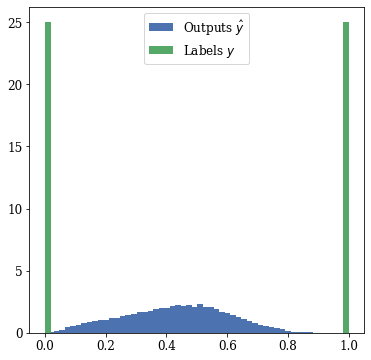

In [52]:
plt.rcParams["figure.figsize"] = (6,6)
plt.hist(OUTPUTS, bins=50, density=True, label = "Outputs $\hat{y}$")
plt.hist(LABELS, bins=50,density=True, label = "Labels $y$")
plt.legend()
plt.show()

In [53]:

def plot_distributions(p, t):
    ps = p[t > 0.5] 
    pb = p[t < 0.5] 
    
    # create an empty figure
    fig = plt.figure(figsize=(5, 5))
    fig.tight_layout()
    
    # add a subplot to it
    nrows, ncols, index = 1,1,1
    ax  = fig.add_subplot(nrows,ncols,index)
    ax.set_xlim(0, 1)

    ax.hist(ps, bins=50, color='b',
            histtype='stepfilled',
            alpha=0.3, label='$t = 1$')
    
    ax.hist(pb, bins=50, color='r',
            histtype='stepfilled',
            alpha=0.3, label='$t = 0$')
    
    ax.set_xlabel('$p(1|x)$', fontsize=FONTSIZE)
    ax.legend(loc='upper right')

    plt.show()

## Compute the probability distribution of the model's predicted class labels

We must call model.eval() to set dropout and batch normalization layers to evaluation mode before running inferenc

In [57]:
def compute_prob(model, xx):
    # convert from numpy array to a torch tensor of type float
    """Gives P(y=1|x)"""
    x = torch.from_numpy(xx).float()#.to(device)

    # compute p(1|x)
    model.eval() # evaluation mode
    p = model(x)#.to(device)

    # squeeze() removes extraneous dimensions
    p = p.squeeze()

    # detach().numpy() converts back to a numpy array
    p = p.detach().cpu().numpy()
    return p

In [58]:
p = compute_prob(model, test_data)
p

array([0.3029733 , 0.28191158, 0.6500339 , ..., 0.5197745 , 0.4848489 ,
       0.39716208], dtype=float32)

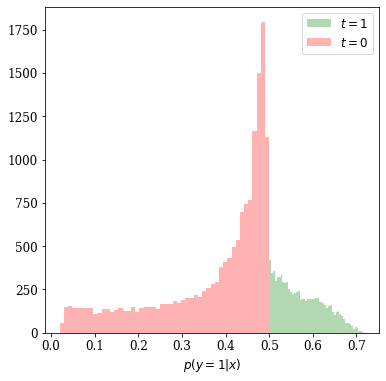

In [59]:
plt.rcParams["figure.figsize"] = (6,6)
plt.hist(p[p>0.5], bins=50, color='g',
            histtype='stepfilled',
            alpha=0.3,label = '$t = 1$')
plt.hist(p[p<0.5], bins=50, color='r',
            histtype='stepfilled',
            alpha=0.3,label = '$t = 0$')
plt.xlabel('$p(y=1|x)$', fontsize=FONTSIZE)
plt.legend()

## Save Model

In [60]:
model_path = "./MLP_model.pt"
torch.save(model.state_dict(), model_path)

## Load Trained Model (could be from another notebook)
This model will then be reinstatiated and used in another part of our code in another notebook (as the worflow diagram shows).

In [61]:
model.load_state_dict(torch.load(model_path))
model.eval()

Model(
  (model): Sequential(
    (0): Linear(in_features=15, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.3, inplace=False)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.3, inplace=False)
    (7): ReLU()
    (8): Linear(in_features=128, out_features=128, bias=True)
    (9): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Dropout(p=0.3, inplace=False)
    (11): ReLU()
    (12): Linear(in_features=128, out_features=128, bias=True)
    (13): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): Dropout(p=0.3, inplace=False)
    (15): ReLU()
    (16): Linear(in_features=128, out_features=128, bias=True)
    (17): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_run

Examine the parameters of our loaded trained model

In [62]:
#now we can use our trained model
print([i for i in model.parameters()][0])

Parameter containing:
tensor([[-0.1315,  0.2381, -0.1926,  ..., -0.0194,  0.0245, -0.2514],
        [ 0.2295,  0.1239, -0.2233,  ...,  0.1088,  0.0503,  0.1808],
        [-0.1309, -0.2688, -0.0939,  ...,  0.0866,  0.0231,  0.0627],
        ...,
        [ 0.1116,  0.0533,  0.2318,  ...,  0.0023, -0.0147, -0.0690],
        [-0.0972, -0.1721, -0.2485,  ..., -0.1845, -0.1311, -0.0056],
        [ 0.1732, -0.1880, -0.0078,  ..., -0.2479,  0.2588, -0.1150]],
       requires_grad=True)


##Now this model can be reconstituted outside this noteboook, and passed to a constructor which uses it.

This is an example of the class outside this notebook which reconstructs and uses this (or any) model. This class takes the model, and it multiplies the product of Poissons where for each Poisson the mean count $I$ is solved from the ODE IVP.

## Evaluate Loaded Model and predict labels

In [63]:
outputs = []
labels = []
accuracies = []

#evaluate
with torch.no_grad():
    for data in test_loader:
        data_cp = copy.deepcopy(data)
        
        xtest = data_cp["x"]
        ytest = data_cp["y"]
        output = model(xtest)
        labels.append(ytest)
        outputs.append(output)
        
        y_predicted_cls = output.round()
        acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])#bumber of correct predictions/sizeofytest
        #accuracies.append(acc.numpy())
        #print(f'accuracy: {acc.item():.4f}')
        
        del data_cp

#     acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])
#     print(f'accuracy: {acc.item():.4f}')

In [64]:
outputs[0:2]

[tensor([[0.3030],
         [0.2819],
         [0.6500],
         [0.2180],
         [0.4315],
         [0.4702],
         [0.3986],
         [0.5186],
         [0.6510],
         [0.6448]]), tensor([[0.5266],
         [0.0644],
         [0.5298],
         [0.4635],
         [0.6628],
         [0.0706],
         [0.4642],
         [0.4428],
         [0.4418],
         [0.2330]])]

In [65]:
OUTPUTS = torch.cat(outputs).view(-1).numpy()#concatenate everything

LABELS = torch.cat(labels).view(-1).numpy()
OUTPUTS, LABELS

(array([0.3029733 , 0.28191155, 0.6500339 , ..., 0.5197745 , 0.4848489 ,
        0.397162  ], dtype=float32),
 array([0., 0., 1., ..., 0., 1., 1.], dtype=float32))

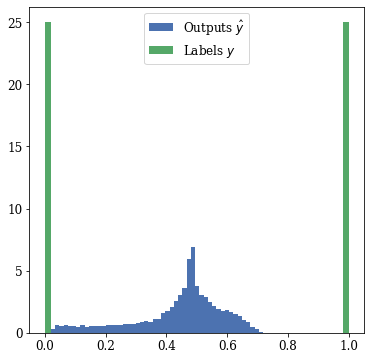

In [66]:
plt.rcParams["figure.figsize"] = (6,6)
plt.hist(OUTPUTS, bins=50, density=True, label = "Outputs $\hat{y}$")
plt.hist(LABELS, bins=50,density=True, label = "Labels $y$")
plt.legend()
plt.show()

_________________
# Hyperparameter Tuning 
### With Optuna, and Exploring (other) Different Model Architectures Here (Below). 
If you follow the same recipe as the "Model" class, other models like CNN's are fully compatible here.

In [88]:
filepath = "MLP_Tuned.pt"

def perform_training(params, save_model=False):
    """Trains the model in a number of specified epochs and returns the best loss.
    the model hyperparameters are defined using the params dictionary, to be easily tuned later"""
    xtrain = train_data;  xtest = test_data
    ytrain = train_targets;  ytest = test_targets

    model =  Model(nfeatures=xtrain.shape[1], 
                ntargets=1,
                nlayers=params["num_layers"], 
                hidden_size=params["hidden_size"], 
                dropout=params["dropout"])

    optimizer = torch.optim.Adam(model.parameters(), lr = params["learning_rate"])

    eng = Engine(model=model, optimizer = optimizer)
    best_loss = np.inf
    early_stopping_iter = 10
    early_stopping_counter = 0
    EPOCHS=22


    for epoch in range(EPOCHS):
        train_loss = eng.train(train_loader)
        test_loss = eng.train(test_loader)
        print("Epoch : %-10g, Training Loss: %-10g, Test Loss: %-10g" % (epoch, train_loss, test_loss))
        #print(f"{epoch}, {train_loss}, {test_loss}")
        if test_loss < best_loss:
            best_loss = test_loss
            if save_model:
                #save model here
                torch.save(model, filepath) #OR
                #torch.save(model.state_dict(), filepath)
            
        else:
            early_stopping_counter += 1
        
        if early_stopping_counter > early_stopping_iter:
            #if we are not improving for 10 iterations then break the loop
            break
        
    return best_loss

### Create Objective Function

In [89]:
#objective funcetion takes an argument called trial
def objective(trial):
    #define your parameters (that you want to tune) dictionary. Everytime the trial is called, these parameters are created
    #the name of the value could be the same as the key or different. Then the ranges
    params = {"num_layers": trial.suggest_int("num_layers", 1, 9),
              "hidden_size": trial.suggest_int("hidden_size", 16, 2048),
              "dropout": trial.suggest_uniform("dropout", 0.1, 0.7), #suggest a value for dropout from a uniform distribution, could be suggest_float
                "learning_rate": trial.suggest_uniform("learning_rate", 1e-6, 1e-3)
             }
    
    all_losses = [] #list of all losses from different folds
    temp_loss = perform_training(params, save_model=True)
    all_losses.append(temp_loss)
    
    return np.mean(all_losses)
              
             
    #The trials come from Optuna's trial, which is a process of evaluating an objective function.
    #see https://optuna.readthedocs.io/en/stable/reference/generated/optuna.trial.Trial.html#optuna.trial.Trial
    

### Create a study

In [92]:
study = optuna.create_study(direction="minimize")#define a direction; in this case we are minimizing the loss
study.optimize(objective, n_trials=30)

best_trial = study.best_trial
#print("best trial" % best_trial)
print(best_trial.values)
print(best_trial.params)

score = perform_training(params=best_trial.params, save_model=True)
print(score)

[I 2021-06-10 01:44:10,642] A new study created in memory with name: no-name-ec5295d7-f61e-4ff4-a469-2b6f5f0ae049


Epoch : 0         , Training Loss: 0.0001072 , Test Loss: 0.000293407
Epoch : 1         , Training Loss: 0.000115562, Test Loss: 0.00028033
Epoch : 2         , Training Loss: 0.000102995, Test Loss: 0.000299112
Epoch : 3         , Training Loss: 7.72763e-05, Test Loss: 0.000283137
Epoch : 4         , Training Loss: 0.000101392, Test Loss: 0.000286477
Epoch : 5         , Training Loss: 0.000101562, Test Loss: 0.000279587
Epoch : 6         , Training Loss: 0.000105728, Test Loss: 0.000289159
Epoch : 7         , Training Loss: 9.38982e-05, Test Loss: 0.000287099
Epoch : 8         , Training Loss: 7.91396e-05, Test Loss: 0.000283055
Epoch : 9         , Training Loss: 8.30247e-05, Test Loss: 0.000288647
Epoch : 10        , Training Loss: 8.18177e-05, Test Loss: 0.00028139
Epoch : 11        , Training Loss: 8.52579e-05, Test Loss: 0.000278008
Epoch : 12        , Training Loss: 7.79115e-05, Test Loss: 0.000278276
Epoch : 13        , Training Loss: 9.58887e-05, Test Loss: 0.000278499


[I 2021-06-10 01:44:17,458] Trial 0 finished with value: 0.00027800800800323485 and parameters: {'num_layers': 8, 'hidden_size': 795, 'dropout': 0.17729849130093, 'learning_rate': 4.553832433489307e-05}. Best is trial 0 with value: 0.00027800800800323485.


Epoch : 14        , Training Loss: 9.66516e-05, Test Loss: 0.000281433
Epoch : 0         , Training Loss: 0.000104911, Test Loss: 0.000309908
Epoch : 1         , Training Loss: 9.81024e-05, Test Loss: 0.000277194
Epoch : 2         , Training Loss: 8.95815e-05, Test Loss: 0.000290842
Epoch : 3         , Training Loss: 0.000103064, Test Loss: 0.000291909
Epoch : 4         , Training Loss: 0.000100945, Test Loss: 0.000290068
Epoch : 5         , Training Loss: 0.00010702, Test Loss: 0.000299494
Epoch : 6         , Training Loss: 9.39421e-05, Test Loss: 0.000288692
Epoch : 7         , Training Loss: 9.8016e-05, Test Loss: 0.000293503
Epoch : 8         , Training Loss: 0.000105684, Test Loss: 0.000297274
Epoch : 9         , Training Loss: 0.000111676, Test Loss: 0.000291  
Epoch : 10        , Training Loss: 9.79687e-05, Test Loss: 0.00029475
Epoch : 11        , Training Loss: 8.61748e-05, Test Loss: 0.000279309


[I 2021-06-10 01:44:20,300] Trial 1 finished with value: 0.000277193546295166 and parameters: {'num_layers': 7, 'hidden_size': 281, 'dropout': 0.5643357193615403, 'learning_rate': 0.00010077053465754465}. Best is trial 1 with value: 0.000277193546295166.


Epoch : 12        , Training Loss: 0.000108663, Test Loss: 0.000303379
Epoch : 0         , Training Loss: 0.00011463, Test Loss: 0.000303392
Epoch : 1         , Training Loss: 0.000103077, Test Loss: 0.000288815
Epoch : 2         , Training Loss: 8.24802e-05, Test Loss: 0.000287042
Epoch : 3         , Training Loss: 0.000118731, Test Loss: 0.000282726
Epoch : 4         , Training Loss: 8.60661e-05, Test Loss: 0.000258089
Epoch : 5         , Training Loss: 9.44067e-05, Test Loss: 0.000264344
Epoch : 6         , Training Loss: 8.17858e-05, Test Loss: 0.000261264
Epoch : 7         , Training Loss: 9.69568e-05, Test Loss: 0.000258002
Epoch : 8         , Training Loss: 9.62723e-05, Test Loss: 0.000250183
Epoch : 9         , Training Loss: 0.000111509, Test Loss: 0.000243978
Epoch : 10        , Training Loss: 0.000100174, Test Loss: 0.000256237
Epoch : 11        , Training Loss: 9.54115e-05, Test Loss: 0.000241545
Epoch : 12        , Training Loss: 8.76428e-05, Test Loss: 0.000244985
Epoch :

[I 2021-06-10 01:44:24,171] Trial 2 finished with value: 0.00022503018379211426 and parameters: {'num_layers': 2, 'hidden_size': 234, 'dropout': 0.411227510730531, 'learning_rate': 0.000543361930930447}. Best is trial 2 with value: 0.00022503018379211426.


Epoch : 21        , Training Loss: 9.41131e-05, Test Loss: 0.000231751
Epoch : 0         , Training Loss: 0.000100415, Test Loss: 0.000277707
Epoch : 1         , Training Loss: 0.000107582, Test Loss: 0.000270884
Epoch : 2         , Training Loss: 9.21328e-05, Test Loss: 0.000280784
Epoch : 3         , Training Loss: 8.39209e-05, Test Loss: 0.000297942
Epoch : 4         , Training Loss: 9.22268e-05, Test Loss: 0.000279032
Epoch : 5         , Training Loss: 9.79414e-05, Test Loss: 0.000279086
Epoch : 6         , Training Loss: 8.59766e-05, Test Loss: 0.000275161
Epoch : 7         , Training Loss: 9.84759e-05, Test Loss: 0.000287727
Epoch : 8         , Training Loss: 9.53502e-05, Test Loss: 0.000300997
Epoch : 9         , Training Loss: 8.79437e-05, Test Loss: 0.000283635
Epoch : 10        , Training Loss: 9.55365e-05, Test Loss: 0.000286592
Epoch : 11        , Training Loss: 9.88184e-05, Test Loss: 0.000286297


[I 2021-06-10 01:44:30,265] Trial 3 finished with value: 0.0002708840847015381 and parameters: {'num_layers': 8, 'hidden_size': 829, 'dropout': 0.6694559896910103, 'learning_rate': 0.0009386202282804199}. Best is trial 2 with value: 0.00022503018379211426.


Epoch : 12        , Training Loss: 0.000103226, Test Loss: 0.000280894
Epoch : 0         , Training Loss: 0.000111731, Test Loss: 0.000303173
Epoch : 1         , Training Loss: 9.40185e-05, Test Loss: 0.000272921
Epoch : 2         , Training Loss: 0.000106802, Test Loss: 0.000297233
Epoch : 3         , Training Loss: 8.40002e-05, Test Loss: 0.00028762
Epoch : 4         , Training Loss: 9.64778e-05, Test Loss: 0.000275187
Epoch : 5         , Training Loss: 0.000108889, Test Loss: 0.000311979
Epoch : 6         , Training Loss: 8.75276e-05, Test Loss: 0.000286124
Epoch : 7         , Training Loss: 0.000108928, Test Loss: 0.000283889
Epoch : 8         , Training Loss: 8.95288e-05, Test Loss: 0.000291021
Epoch : 9         , Training Loss: 9.52099e-05, Test Loss: 0.000286149
Epoch : 10        , Training Loss: 0.000100412, Test Loss: 0.000285395
Epoch : 11        , Training Loss: 9.3386e-05, Test Loss: 0.000279701


[I 2021-06-10 01:44:47,191] Trial 4 finished with value: 0.0002729211330413818 and parameters: {'num_layers': 9, 'hidden_size': 1615, 'dropout': 0.6962889592453081, 'learning_rate': 0.00043343965497808526}. Best is trial 2 with value: 0.00022503018379211426.


Epoch : 12        , Training Loss: 8.56757e-05, Test Loss: 0.000278287
Epoch : 0         , Training Loss: 8.06308e-05, Test Loss: 0.000275972
Epoch : 1         , Training Loss: 0.000107279, Test Loss: 0.000250822
Epoch : 2         , Training Loss: 9.82814e-05, Test Loss: 0.000213853
Epoch : 3         , Training Loss: 9.71802e-05, Test Loss: 0.000206593
Epoch : 4         , Training Loss: 8.40904e-05, Test Loss: 0.000223023
Epoch : 5         , Training Loss: 9.82513e-05, Test Loss: 0.000206663
Epoch : 6         , Training Loss: 9.62716e-05, Test Loss: 0.000202932
Epoch : 7         , Training Loss: 0.00011582, Test Loss: 0.000202431
Epoch : 8         , Training Loss: 0.000113552, Test Loss: 0.000206259
Epoch : 9         , Training Loss: 0.000115928, Test Loss: 0.000213586
Epoch : 10        , Training Loss: 8.3674e-05, Test Loss: 0.00020313
Epoch : 11        , Training Loss: 9.46128e-05, Test Loss: 0.000201825
Epoch : 12        , Training Loss: 0.000103084, Test Loss: 0.000202555
Epoch : 1

[I 2021-06-10 01:44:58,817] Trial 5 finished with value: 0.00020182452201843263 and parameters: {'num_layers': 6, 'hidden_size': 1202, 'dropout': 0.21281962951359468, 'learning_rate': 0.0005838345130185725}. Best is trial 5 with value: 0.00020182452201843263.


Epoch : 17        , Training Loss: 9.54617e-05, Test Loss: 0.000212591
Epoch : 0         , Training Loss: 7.8891e-05, Test Loss: 0.000295891
Epoch : 1         , Training Loss: 9.41328e-05, Test Loss: 0.000293652
Epoch : 2         , Training Loss: 0.000101791, Test Loss: 0.000279218
Epoch : 3         , Training Loss: 0.000107247, Test Loss: 0.000287818
Epoch : 4         , Training Loss: 8.78433e-05, Test Loss: 0.000292652
Epoch : 5         , Training Loss: 7.30426e-05, Test Loss: 0.000291862
Epoch : 6         , Training Loss: 8.5996e-05, Test Loss: 0.000292793
Epoch : 7         , Training Loss: 0.000106483, Test Loss: 0.000309896
Epoch : 8         , Training Loss: 0.000100598, Test Loss: 0.000287406
Epoch : 9         , Training Loss: 8.59391e-05, Test Loss: 0.000270692
Epoch : 10        , Training Loss: 9.68311e-05, Test Loss: 0.000295061
Epoch : 11        , Training Loss: 8.67395e-05, Test Loss: 0.000300824
Epoch : 12        , Training Loss: 0.000106237, Test Loss: 0.000294979
Epoch : 

[I 2021-06-10 01:45:02,098] Trial 6 finished with value: 0.0002706918478012085 and parameters: {'num_layers': 7, 'hidden_size': 230, 'dropout': 0.5183751735914173, 'learning_rate': 0.00020696669538696377}. Best is trial 5 with value: 0.00020182452201843263.


Epoch : 14        , Training Loss: 0.000115521, Test Loss: 0.000287989
Epoch : 0         , Training Loss: 9.0511e-05, Test Loss: 0.000291341
Epoch : 1         , Training Loss: 0.000101756, Test Loss: 0.000296856
Epoch : 2         , Training Loss: 8.94906e-05, Test Loss: 0.000270866
Epoch : 3         , Training Loss: 0.000102181, Test Loss: 0.000281794
Epoch : 4         , Training Loss: 0.00010738, Test Loss: 0.000284097
Epoch : 5         , Training Loss: 9.71792e-05, Test Loss: 0.000251988
Epoch : 6         , Training Loss: 8.70802e-05, Test Loss: 0.000247741
Epoch : 7         , Training Loss: 9.28534e-05, Test Loss: 0.0002372 
Epoch : 8         , Training Loss: 0.00011051, Test Loss: 0.000242277
Epoch : 9         , Training Loss: 9.4181e-05, Test Loss: 0.000254714
Epoch : 10        , Training Loss: 9.09926e-05, Test Loss: 0.000229912
Epoch : 11        , Training Loss: 9.91375e-05, Test Loss: 0.000231627
Epoch : 12        , Training Loss: 0.00010469, Test Loss: 0.000230045
Epoch : 13  

[I 2021-06-10 01:45:37,976] Trial 7 finished with value: 0.0002052314519882202 and parameters: {'num_layers': 9, 'hidden_size': 2040, 'dropout': 0.38330039426678375, 'learning_rate': 0.00034366945253042443}. Best is trial 5 with value: 0.00020182452201843263.


Epoch : 18        , Training Loss: 9.95963e-05, Test Loss: 0.000208296
Epoch : 0         , Training Loss: 9.49062e-05, Test Loss: 0.000278604
Epoch : 1         , Training Loss: 8.7064e-05, Test Loss: 0.000288106
Epoch : 2         , Training Loss: 8.47227e-05, Test Loss: 0.000279904
Epoch : 3         , Training Loss: 9.27588e-05, Test Loss: 0.000279022
Epoch : 4         , Training Loss: 9.08662e-05, Test Loss: 0.000288898
Epoch : 5         , Training Loss: 9.94335e-05, Test Loss: 0.000268867
Epoch : 6         , Training Loss: 8.43479e-05, Test Loss: 0.0002826 
Epoch : 7         , Training Loss: 8.68531e-05, Test Loss: 0.000288152
Epoch : 8         , Training Loss: 0.000104955, Test Loss: 0.000267254
Epoch : 9         , Training Loss: 9.11903e-05, Test Loss: 0.000281867
Epoch : 10        , Training Loss: 8.06533e-05, Test Loss: 0.000274451
Epoch : 11        , Training Loss: 0.000103769, Test Loss: 0.000271488
Epoch : 12        , Training Loss: 9.6358e-05, Test Loss: 0.000254494
Epoch : 1

[I 2021-06-10 01:45:47,227] Trial 8 finished with value: 0.0002544938564300537 and parameters: {'num_layers': 7, 'hidden_size': 999, 'dropout': 0.383797793888353, 'learning_rate': 0.00021624735015569912}. Best is trial 5 with value: 0.00020182452201843263.


Epoch : 14        , Training Loss: 8.83964e-05, Test Loss: 0.000262601
Epoch : 0         , Training Loss: 6.95508e-05, Test Loss: 0.000295354
Epoch : 1         , Training Loss: 0.000102047, Test Loss: 0.000300222
Epoch : 2         , Training Loss: 0.000101443, Test Loss: 0.00030172
Epoch : 3         , Training Loss: 8.914e-05 , Test Loss: 0.000283579
Epoch : 4         , Training Loss: 0.000111355, Test Loss: 0.000280003
Epoch : 5         , Training Loss: 8.4577e-05, Test Loss: 0.000272342
Epoch : 6         , Training Loss: 9.05013e-05, Test Loss: 0.000292484
Epoch : 7         , Training Loss: 9.82278e-05, Test Loss: 0.000252469
Epoch : 8         , Training Loss: 8.76858e-05, Test Loss: 0.000293093
Epoch : 9         , Training Loss: 0.000108495, Test Loss: 0.000256084
Epoch : 10        , Training Loss: 8.46367e-05, Test Loss: 0.000245971
Epoch : 11        , Training Loss: 0.000104093, Test Loss: 0.000246319
Epoch : 12        , Training Loss: 7.53611e-05, Test Loss: 0.000236605
Epoch : 1

[I 2021-06-10 01:45:58,923] Trial 9 finished with value: 0.00022615504264831543 and parameters: {'num_layers': 7, 'hidden_size': 940, 'dropout': 0.49230440344724335, 'learning_rate': 0.0006992019752864445}. Best is trial 5 with value: 0.00020182452201843263.


Epoch : 19        , Training Loss: 9.26116e-05, Test Loss: 0.00022719
Epoch : 0         , Training Loss: 9.65207e-05, Test Loss: 0.00027121
Epoch : 1         , Training Loss: 9.07799e-05, Test Loss: 0.00021032
Epoch : 2         , Training Loss: 8.6391e-05, Test Loss: 0.000222221
Epoch : 3         , Training Loss: 8.68271e-05, Test Loss: 0.00021261
Epoch : 4         , Training Loss: 9.42139e-05, Test Loss: 0.000204106
Epoch : 5         , Training Loss: 9.03174e-05, Test Loss: 0.000203479
Epoch : 6         , Training Loss: 0.000101721, Test Loss: 0.000202358
Epoch : 7         , Training Loss: 0.000118646, Test Loss: 0.000201869
Epoch : 8         , Training Loss: 8.89586e-05, Test Loss: 0.00020164
Epoch : 9         , Training Loss: 7.17474e-05, Test Loss: 0.000201991
Epoch : 10        , Training Loss: 8.05349e-05, Test Loss: 0.000207026
Epoch : 11        , Training Loss: 8.54509e-05, Test Loss: 0.000205377
Epoch : 12        , Training Loss: 9.15143e-05, Test Loss: 0.000201883
Epoch : 13  

[I 2021-06-10 01:46:13,774] Trial 10 finished with value: 0.00020131924152374267 and parameters: {'num_layers': 4, 'hidden_size': 1523, 'dropout': 0.10518807203657021, 'learning_rate': 0.0008553959910335819}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 0.000118629, Test Loss: 0.000201345
Epoch : 0         , Training Loss: 0.000108574, Test Loss: 0.000259498
Epoch : 1         , Training Loss: 9.1118e-05, Test Loss: 0.000215771
Epoch : 2         , Training Loss: 7.63633e-05, Test Loss: 0.000212456
Epoch : 3         , Training Loss: 0.000104928, Test Loss: 0.000203046
Epoch : 4         , Training Loss: 0.000105609, Test Loss: 0.000206102
Epoch : 5         , Training Loss: 8.39646e-05, Test Loss: 0.000206763
Epoch : 6         , Training Loss: 8.67181e-05, Test Loss: 0.00020917
Epoch : 7         , Training Loss: 9.06811e-05, Test Loss: 0.000202557
Epoch : 8         , Training Loss: 7.32507e-05, Test Loss: 0.000202374
Epoch : 9         , Training Loss: 0.000112263, Test Loss: 0.000202079
Epoch : 10        , Training Loss: 9.48371e-05, Test Loss: 0.000201956
Epoch : 11        , Training Loss: 8.35946e-05, Test Loss: 0.000202686
Epoch : 12        , Training Loss: 8.45418e-05, Test Loss: 0.000202098
Epoch : 

[I 2021-06-10 01:46:27,424] Trial 11 finished with value: 0.00020161514282226564 and parameters: {'num_layers': 4, 'hidden_size': 1501, 'dropout': 0.12531365584544019, 'learning_rate': 0.000889348765653019}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 20        , Training Loss: 9.15581e-05, Test Loss: 0.000202284
Epoch : 0         , Training Loss: 9.53765e-05, Test Loss: 0.000295668
Epoch : 1         , Training Loss: 9.35127e-05, Test Loss: 0.000225221
Epoch : 2         , Training Loss: 8.46144e-05, Test Loss: 0.000205075
Epoch : 3         , Training Loss: 9.66703e-05, Test Loss: 0.000202309
Epoch : 4         , Training Loss: 9.10263e-05, Test Loss: 0.000205192
Epoch : 5         , Training Loss: 0.000111955, Test Loss: 0.000209175
Epoch : 6         , Training Loss: 0.000112308, Test Loss: 0.000205616
Epoch : 7         , Training Loss: 8.12801e-05, Test Loss: 0.000203874
Epoch : 8         , Training Loss: 9.75264e-05, Test Loss: 0.000203025
Epoch : 9         , Training Loss: 9.04691e-05, Test Loss: 0.000202697
Epoch : 10        , Training Loss: 9.33554e-05, Test Loss: 0.00020245
Epoch : 11        , Training Loss: 0.000106664, Test Loss: 0.000201963
Epoch : 12        , Training Loss: 0.00010633, Test Loss: 0.000202468
Epoch : 

[I 2021-06-10 01:46:38,155] Trial 12 finished with value: 0.00020166559219360352 and parameters: {'num_layers': 3, 'hidden_size': 1665, 'dropout': 0.10114100541518756, 'learning_rate': 0.0009794017464329948}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 18        , Training Loss: 8.66926e-05, Test Loss: 0.00020182
Epoch : 0         , Training Loss: 0.000106227, Test Loss: 0.000302597
Epoch : 1         , Training Loss: 7.85483e-05, Test Loss: 0.000225385
Epoch : 2         , Training Loss: 6.35658e-05, Test Loss: 0.000219301
Epoch : 3         , Training Loss: 9.84416e-05, Test Loss: 0.0002019 
Epoch : 4         , Training Loss: 0.000106251, Test Loss: 0.000201807
Epoch : 5         , Training Loss: 7.94043e-05, Test Loss: 0.000202303
Epoch : 6         , Training Loss: 8.78814e-05, Test Loss: 0.000202239
Epoch : 7         , Training Loss: 0.000107349, Test Loss: 0.000201971
Epoch : 8         , Training Loss: 0.000101681, Test Loss: 0.000202812
Epoch : 9         , Training Loss: 7.24397e-05, Test Loss: 0.000206396
Epoch : 10        , Training Loss: 0.000103688, Test Loss: 0.000206289
Epoch : 11        , Training Loss: 0.000101402, Test Loss: 0.000204819
Epoch : 12        , Training Loss: 7.89352e-05, Test Loss: 0.000202362
Epoch : 

[I 2021-06-10 01:46:51,395] Trial 13 finished with value: 0.00020156257152557374 and parameters: {'num_layers': 4, 'hidden_size': 1515, 'dropout': 0.11007059728512039, 'learning_rate': 0.0008237441940389846}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 19        , Training Loss: 8.61386e-05, Test Loss: 0.000201633
Epoch : 0         , Training Loss: 0.000103494, Test Loss: 0.000305192
Epoch : 1         , Training Loss: 0.000103026, Test Loss: 0.000291577
Epoch : 2         , Training Loss: 9.23145e-05, Test Loss: 0.000274825
Epoch : 3         , Training Loss: 8.50726e-05, Test Loss: 0.000264758
Epoch : 4         , Training Loss: 8.955e-05 , Test Loss: 0.000259696
Epoch : 5         , Training Loss: 9.434e-05 , Test Loss: 0.000250652
Epoch : 6         , Training Loss: 9.66175e-05, Test Loss: 0.000250185
Epoch : 7         , Training Loss: 9.10805e-05, Test Loss: 0.00024364
Epoch : 8         , Training Loss: 8.7353e-05, Test Loss: 0.000239212
Epoch : 9         , Training Loss: 9.85224e-05, Test Loss: 0.000234671
Epoch : 10        , Training Loss: 8.88028e-05, Test Loss: 0.000234354
Epoch : 11        , Training Loss: 8.58234e-05, Test Loss: 0.000229634
Epoch : 12        , Training Loss: 8.48065e-05, Test Loss: 0.000227285
Epoch : 13

[I 2021-06-10 01:46:56,266] Trial 14 finished with value: 0.00022082428932189942 and parameters: {'num_layers': 1, 'hidden_size': 1997, 'dropout': 0.21364989271235008, 'learning_rate': 0.0007642942049722559}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 0.000103238, Test Loss: 0.000220824
Epoch : 0         , Training Loss: 9.45624e-05, Test Loss: 0.000310611
Epoch : 1         , Training Loss: 9.37057e-05, Test Loss: 0.00022979
Epoch : 2         , Training Loss: 8.90185e-05, Test Loss: 0.000209902
Epoch : 3         , Training Loss: 0.000100628, Test Loss: 0.000207456
Epoch : 4         , Training Loss: 8.5106e-05, Test Loss: 0.000204157
Epoch : 5         , Training Loss: 0.000103174, Test Loss: 0.000206394
Epoch : 6         , Training Loss: 9.38924e-05, Test Loss: 0.00020241
Epoch : 7         , Training Loss: 8.21577e-05, Test Loss: 0.000201774
Epoch : 8         , Training Loss: 9.12352e-05, Test Loss: 0.00020197
Epoch : 9         , Training Loss: 0.000108003, Test Loss: 0.000202061
Epoch : 10        , Training Loss: 0.000101502, Test Loss: 0.000201835
Epoch : 11        , Training Loss: 0.000105776, Test Loss: 0.000201784
Epoch : 12        , Training Loss: 0.000106985, Test Loss: 0.000202286
Epoch : 13

[I 2021-06-10 01:47:09,012] Trial 15 finished with value: 0.00020154004096984863 and parameters: {'num_layers': 5, 'hidden_size': 1320, 'dropout': 0.25420832125247883, 'learning_rate': 0.0007952457245308474}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 18        , Training Loss: 0.000111854, Test Loss: 0.000203974
Epoch : 0         , Training Loss: 0.000105748, Test Loss: 0.000273686
Epoch : 1         , Training Loss: 8.99617e-05, Test Loss: 0.000246814
Epoch : 2         , Training Loss: 9.90547e-05, Test Loss: 0.000227178
Epoch : 3         , Training Loss: 8.55503e-05, Test Loss: 0.000218088
Epoch : 4         , Training Loss: 9.03113e-05, Test Loss: 0.000213666
Epoch : 5         , Training Loss: 9.79868e-05, Test Loss: 0.000210251
Epoch : 6         , Training Loss: 9.76175e-05, Test Loss: 0.000206138
Epoch : 7         , Training Loss: 0.000120379, Test Loss: 0.000204847
Epoch : 8         , Training Loss: 8.95546e-05, Test Loss: 0.000202613
Epoch : 9         , Training Loss: 7.76194e-05, Test Loss: 0.000203714
Epoch : 10        , Training Loss: 0.000102471, Test Loss: 0.000202777
Epoch : 11        , Training Loss: 0.000105318, Test Loss: 0.00020242
Epoch : 12        , Training Loss: 9.5553e-05, Test Loss: 0.000202487
Epoch : 

[I 2021-06-10 01:47:23,330] Trial 16 finished with value: 0.0002022533893585205 and parameters: {'num_layers': 5, 'hidden_size': 1292, 'dropout': 0.3003279392482715, 'learning_rate': 0.0006663008950144821}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 9.82193e-05, Test Loss: 0.000212208
Epoch : 0         , Training Loss: 7.86145e-05, Test Loss: 0.000301258
Epoch : 1         , Training Loss: 8.01719e-05, Test Loss: 0.000209375
Epoch : 2         , Training Loss: 8.52231e-05, Test Loss: 0.000205668
Epoch : 3         , Training Loss: 0.000114248, Test Loss: 0.000201508
Epoch : 4         , Training Loss: 7.6836e-05, Test Loss: 0.000203121
Epoch : 5         , Training Loss: 0.000108042, Test Loss: 0.000203617
Epoch : 6         , Training Loss: 0.000104058, Test Loss: 0.000210542
Epoch : 7         , Training Loss: 9.49545e-05, Test Loss: 0.00020177
Epoch : 8         , Training Loss: 0.000112311, Test Loss: 0.000201667
Epoch : 9         , Training Loss: 0.000106193, Test Loss: 0.000201876
Epoch : 10        , Training Loss: 8.04911e-05, Test Loss: 0.000201435
Epoch : 11        , Training Loss: 8.3579e-05, Test Loss: 0.000201645
Epoch : 12        , Training Loss: 0.000100518, Test Loss: 0.000201757
Epoch : 1

[I 2021-06-10 01:47:36,537] Trial 17 finished with value: 0.00020143513679504393 and parameters: {'num_layers': 4, 'hidden_size': 1824, 'dropout': 0.28922141900578485, 'learning_rate': 0.0009927234521346277}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 15        , Training Loss: 0.000102139, Test Loss: 0.00021583
Epoch : 0         , Training Loss: 0.000100474, Test Loss: 0.000263927
Epoch : 1         , Training Loss: 0.000109217, Test Loss: 0.000218871
Epoch : 2         , Training Loss: 0.000103188, Test Loss: 0.000214001
Epoch : 3         , Training Loss: 8.4313e-05, Test Loss: 0.000216595
Epoch : 4         , Training Loss: 9.62289e-05, Test Loss: 0.00021247
Epoch : 5         , Training Loss: 8.77306e-05, Test Loss: 0.000203675
Epoch : 6         , Training Loss: 9.02984e-05, Test Loss: 0.000202156
Epoch : 7         , Training Loss: 9.12355e-05, Test Loss: 0.000201685
Epoch : 8         , Training Loss: 0.000102532, Test Loss: 0.000201681
Epoch : 9         , Training Loss: 9.52301e-05, Test Loss: 0.000201663
Epoch : 10        , Training Loss: 0.000106142, Test Loss: 0.000201736
Epoch : 11        , Training Loss: 9.27376e-05, Test Loss: 0.000201936
Epoch : 12        , Training Loss: 0.000115126, Test Loss: 0.000201875
Epoch : 1

[I 2021-06-10 01:47:51,383] Trial 18 finished with value: 0.0002016310214996338 and parameters: {'num_layers': 3, 'hidden_size': 1862, 'dropout': 0.31550304449889816, 'learning_rate': 0.0009857844111791204}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 0.000115394, Test Loss: 0.000201803
Epoch : 0         , Training Loss: 8.01787e-05, Test Loss: 0.000277239
Epoch : 1         , Training Loss: 0.000102991, Test Loss: 0.000259035
Epoch : 2         , Training Loss: 9.41846e-05, Test Loss: 0.000241542
Epoch : 3         , Training Loss: 9.7378e-05, Test Loss: 0.000238762
Epoch : 4         , Training Loss: 8.66826e-05, Test Loss: 0.000232616
Epoch : 5         , Training Loss: 9.32889e-05, Test Loss: 0.00023054
Epoch : 6         , Training Loss: 9.32702e-05, Test Loss: 0.000228469
Epoch : 7         , Training Loss: 8.02618e-05, Test Loss: 0.000225902
Epoch : 8         , Training Loss: 8.56312e-05, Test Loss: 0.000225312
Epoch : 9         , Training Loss: 0.000125922, Test Loss: 0.00022372
Epoch : 10        , Training Loss: 9.01521e-05, Test Loss: 0.000223425
Epoch : 11        , Training Loss: 9.74963e-05, Test Loss: 0.000223232
Epoch : 12        , Training Loss: 8.75213e-05, Test Loss: 0.000223724
Epoch : 1

[I 2021-06-10 01:47:56,351] Trial 19 finished with value: 0.00022118515968322754 and parameters: {'num_layers': 1, 'hidden_size': 1799, 'dropout': 0.15182655745870088, 'learning_rate': 0.0009968795864041162}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 9.75109e-05, Test Loss: 0.000221637
Epoch : 0         , Training Loss: 0.000105988, Test Loss: 0.000302229
Epoch : 1         , Training Loss: 8.96697e-05, Test Loss: 0.000285584
Epoch : 2         , Training Loss: 8.23339e-05, Test Loss: 0.000266675
Epoch : 3         , Training Loss: 9.9466e-05, Test Loss: 0.000243273
Epoch : 4         , Training Loss: 8.45911e-05, Test Loss: 0.000229393
Epoch : 5         , Training Loss: 0.00011029, Test Loss: 0.000221542
Epoch : 6         , Training Loss: 0.000106771, Test Loss: 0.000220522
Epoch : 7         , Training Loss: 8.99873e-05, Test Loss: 0.000216773
Epoch : 8         , Training Loss: 9.33556e-05, Test Loss: 0.000210381
Epoch : 9         , Training Loss: 9.93881e-05, Test Loss: 0.00020981
Epoch : 10        , Training Loss: 8.67343e-05, Test Loss: 0.000207929
Epoch : 11        , Training Loss: 8.84809e-05, Test Loss: 0.000207031
Epoch : 12        , Training Loss: 9.9792e-05, Test Loss: 0.000205087
Epoch : 13

[I 2021-06-10 01:48:03,201] Trial 20 finished with value: 0.00020428309440612792 and parameters: {'num_layers': 4, 'hidden_size': 560, 'dropout': 0.3067834785044129, 'learning_rate': 0.00087850101738674}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 9.85892e-05, Test Loss: 0.000204658
Epoch : 0         , Training Loss: 0.000103312, Test Loss: 0.00028848
Epoch : 1         , Training Loss: 9.57424e-05, Test Loss: 0.000230304
Epoch : 2         , Training Loss: 9.33026e-05, Test Loss: 0.00021528
Epoch : 3         , Training Loss: 7.19016e-05, Test Loss: 0.000204385
Epoch : 4         , Training Loss: 0.000113787, Test Loss: 0.000202824
Epoch : 5         , Training Loss: 0.000122115, Test Loss: 0.000213079
Epoch : 6         , Training Loss: 0.000100074, Test Loss: 0.000204077
Epoch : 7         , Training Loss: 0.000100784, Test Loss: 0.000206067
Epoch : 8         , Training Loss: 0.000105923, Test Loss: 0.000207328
Epoch : 9         , Training Loss: 8.99035e-05, Test Loss: 0.000207071
Epoch : 10        , Training Loss: 8.68008e-05, Test Loss: 0.000203092
Epoch : 11        , Training Loss: 8.25097e-05, Test Loss: 0.000203283
Epoch : 12        , Training Loss: 9.02326e-05, Test Loss: 0.000204002
Epoch : 

[I 2021-06-10 01:48:13,734] Trial 21 finished with value: 0.00020282409191131593 and parameters: {'num_layers': 5, 'hidden_size': 1330, 'dropout': 0.2559520737142317, 'learning_rate': 0.000775891672715772}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 15        , Training Loss: 9.97953e-05, Test Loss: 0.000205313
Epoch : 0         , Training Loss: 8.12843e-05, Test Loss: 0.000292065
Epoch : 1         , Training Loss: 8.31154e-05, Test Loss: 0.000246377
Epoch : 2         , Training Loss: 9.9666e-05, Test Loss: 0.000219504
Epoch : 3         , Training Loss: 0.000116655, Test Loss: 0.000205177
Epoch : 4         , Training Loss: 0.000105259, Test Loss: 0.000205884
Epoch : 5         , Training Loss: 9.19316e-05, Test Loss: 0.00020449
Epoch : 6         , Training Loss: 0.000101534, Test Loss: 0.000203239
Epoch : 7         , Training Loss: 9.13981e-05, Test Loss: 0.000205409
Epoch : 8         , Training Loss: 7.94965e-05, Test Loss: 0.000203303
Epoch : 9         , Training Loss: 7.18953e-05, Test Loss: 0.000202397
Epoch : 10        , Training Loss: 7.42423e-05, Test Loss: 0.000202743
Epoch : 11        , Training Loss: 8.96306e-05, Test Loss: 0.00020253
Epoch : 12        , Training Loss: 9.63832e-05, Test Loss: 0.000203163
Epoch : 1

[I 2021-06-10 01:48:21,399] Trial 22 finished with value: 0.0002018613338470459 and parameters: {'num_layers': 3, 'hidden_size': 1181, 'dropout': 0.25944292133098573, 'learning_rate': 0.0006381905972341736}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 18        , Training Loss: 9.01887e-05, Test Loss: 0.000202084
Epoch : 0         , Training Loss: 8.01882e-05, Test Loss: 0.000324034
Epoch : 1         , Training Loss: 0.000107495, Test Loss: 0.000213577
Epoch : 2         , Training Loss: 0.000100256, Test Loss: 0.000216303
Epoch : 3         , Training Loss: 0.000109668, Test Loss: 0.000217546
Epoch : 4         , Training Loss: 9.36091e-05, Test Loss: 0.000203367
Epoch : 5         , Training Loss: 9.68272e-05, Test Loss: 0.000204627
Epoch : 6         , Training Loss: 9.39422e-05, Test Loss: 0.000202272
Epoch : 7         , Training Loss: 7.89931e-05, Test Loss: 0.000202292
Epoch : 8         , Training Loss: 8.44668e-05, Test Loss: 0.000204728
Epoch : 9         , Training Loss: 0.000106775, Test Loss: 0.000201605
Epoch : 10        , Training Loss: 9.48777e-05, Test Loss: 0.000201452
Epoch : 11        , Training Loss: 0.00012947, Test Loss: 0.000201612
Epoch : 12        , Training Loss: 8.00355e-05, Test Loss: 0.000203768
Epoch :

[I 2021-06-10 01:48:38,248] Trial 23 finished with value: 0.0002014523983001709 and parameters: {'num_layers': 5, 'hidden_size': 1821, 'dropout': 0.1904330291593919, 'learning_rate': 0.0008465524280148817}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 16        , Training Loss: 8.63714e-05, Test Loss: 0.000201993
Epoch : 0         , Training Loss: 9.47954e-05, Test Loss: 0.000309361
Epoch : 1         , Training Loss: 9.22194e-05, Test Loss: 0.00022258
Epoch : 2         , Training Loss: 0.000104057, Test Loss: 0.000205092
Epoch : 3         , Training Loss: 9.47337e-05, Test Loss: 0.00021839
Epoch : 4         , Training Loss: 9.12382e-05, Test Loss: 0.000208492
Epoch : 5         , Training Loss: 9.19779e-05, Test Loss: 0.00020511
Epoch : 6         , Training Loss: 7.65775e-05, Test Loss: 0.000209056
Epoch : 7         , Training Loss: 0.00012608, Test Loss: 0.000203167
Epoch : 8         , Training Loss: 8.94994e-05, Test Loss: 0.000212801
Epoch : 9         , Training Loss: 8.72188e-05, Test Loss: 0.000202338
Epoch : 10        , Training Loss: 9.12151e-05, Test Loss: 0.000202278
Epoch : 11        , Training Loss: 9.33053e-05, Test Loss: 0.000201963
Epoch : 12        , Training Loss: 9.19487e-05, Test Loss: 0.000201596
Epoch : 13

[I 2021-06-10 01:49:02,129] Trial 24 finished with value: 0.00020146331787109374 and parameters: {'num_layers': 6, 'hidden_size': 1832, 'dropout': 0.17935967814660747, 'learning_rate': 0.0008893842273766418}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 19        , Training Loss: 7.74354e-05, Test Loss: 0.000210383
Epoch : 0         , Training Loss: 9.73177e-05, Test Loss: 0.000288357
Epoch : 1         , Training Loss: 0.000105514, Test Loss: 0.000214217
Epoch : 2         , Training Loss: 7.90866e-05, Test Loss: 0.000203077
Epoch : 3         , Training Loss: 0.000117338, Test Loss: 0.000204751
Epoch : 4         , Training Loss: 0.000100938, Test Loss: 0.00020638
Epoch : 5         , Training Loss: 8.24656e-05, Test Loss: 0.000201761
Epoch : 6         , Training Loss: 0.000103581, Test Loss: 0.000201707
Epoch : 7         , Training Loss: 7.18734e-05, Test Loss: 0.000203326
Epoch : 8         , Training Loss: 0.000106391, Test Loss: 0.000201578
Epoch : 9         , Training Loss: 0.000101094, Test Loss: 0.000202172
Epoch : 10        , Training Loss: 7.17971e-05, Test Loss: 0.000202992
Epoch : 11        , Training Loss: 9.85046e-05, Test Loss: 0.000201783
Epoch : 12        , Training Loss: 0.000103881, Test Loss: 0.000202103
Epoch :

[I 2021-06-10 01:49:18,859] Trial 25 finished with value: 0.00020157809257507323 and parameters: {'num_layers': 4, 'hidden_size': 2045, 'dropout': 0.20869508587538763, 'learning_rate': 0.0007117216707648681}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 16        , Training Loss: 8.91043e-05, Test Loss: 0.000203726
Epoch : 0         , Training Loss: 0.000103424, Test Loss: 0.000285113
Epoch : 1         , Training Loss: 9.72967e-05, Test Loss: 0.000244122
Epoch : 2         , Training Loss: 7.91448e-05, Test Loss: 0.000229462
Epoch : 3         , Training Loss: 9.23002e-05, Test Loss: 0.000220943
Epoch : 4         , Training Loss: 0.00010825, Test Loss: 0.000221138
Epoch : 5         , Training Loss: 0.000112293, Test Loss: 0.000226033
Epoch : 6         , Training Loss: 7.89628e-05, Test Loss: 0.000222776
Epoch : 7         , Training Loss: 9.69007e-05, Test Loss: 0.000218264
Epoch : 8         , Training Loss: 9.6792e-05, Test Loss: 0.000218028
Epoch : 9         , Training Loss: 7.09321e-05, Test Loss: 0.000213153
Epoch : 10        , Training Loss: 0.000114242, Test Loss: 0.000206266
Epoch : 11        , Training Loss: 0.000114016, Test Loss: 0.000204069
Epoch : 12        , Training Loss: 7.00601e-05, Test Loss: 0.000204025
Epoch : 

[I 2021-06-10 01:49:27,986] Trial 26 finished with value: 0.00020272037982940673 and parameters: {'num_layers': 2, 'hidden_size': 1718, 'dropout': 0.3436500549744763, 'learning_rate': 0.0008482357070011097}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 0.000100072, Test Loss: 0.000202781
Epoch : 0         , Training Loss: 0.000115603, Test Loss: 0.000281043
Epoch : 1         , Training Loss: 9.30469e-05, Test Loss: 0.000234576
Epoch : 2         , Training Loss: 9.75055e-05, Test Loss: 0.00025249
Epoch : 3         , Training Loss: 0.000100173, Test Loss: 0.000221182
Epoch : 4         , Training Loss: 7.80025e-05, Test Loss: 0.00020757
Epoch : 5         , Training Loss: 8.79796e-05, Test Loss: 0.000203227
Epoch : 6         , Training Loss: 7.07219e-05, Test Loss: 0.000205304
Epoch : 7         , Training Loss: 8.5212e-05, Test Loss: 0.000204459
Epoch : 8         , Training Loss: 0.000106776, Test Loss: 0.000201667
Epoch : 9         , Training Loss: 9.41534e-05, Test Loss: 0.000201636
Epoch : 10        , Training Loss: 0.00010626, Test Loss: 0.000201768
Epoch : 11        , Training Loss: 7.31634e-05, Test Loss: 0.000205122
Epoch : 12        , Training Loss: 7.32758e-05, Test Loss: 0.00023817
Epoch : 13 

[I 2021-06-10 01:49:53,369] Trial 27 finished with value: 0.0002016362190246582 and parameters: {'num_layers': 6, 'hidden_size': 1947, 'dropout': 0.1000834524524383, 'learning_rate': 0.0009332458019942249}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 17        , Training Loss: 9.01822e-05, Test Loss: 0.000216527
Epoch : 0         , Training Loss: 0.000107599, Test Loss: 0.000266718
Epoch : 1         , Training Loss: 0.000106835, Test Loss: 0.000207849
Epoch : 2         , Training Loss: 0.000102015, Test Loss: 0.000204942
Epoch : 3         , Training Loss: 0.00011892, Test Loss: 0.000204041
Epoch : 4         , Training Loss: 8.56587e-05, Test Loss: 0.000205715
Epoch : 5         , Training Loss: 9.1012e-05, Test Loss: 0.000212217
Epoch : 6         , Training Loss: 8.60236e-05, Test Loss: 0.000210345
Epoch : 7         , Training Loss: 7.56982e-05, Test Loss: 0.00020794
Epoch : 8         , Training Loss: 8.26387e-05, Test Loss: 0.000204888
Epoch : 9         , Training Loss: 6.62331e-05, Test Loss: 0.000203354
Epoch : 10        , Training Loss: 0.00010504, Test Loss: 0.000202211
Epoch : 11        , Training Loss: 7.92923e-05, Test Loss: 0.000202999
Epoch : 12        , Training Loss: 8.0143e-05, Test Loss: 0.000202835
Epoch : 13 

[I 2021-06-10 01:50:03,385] Trial 28 finished with value: 0.0002018754243850708 and parameters: {'num_layers': 3, 'hidden_size': 1514, 'dropout': 0.1432673773215193, 'learning_rate': 0.0007348862321049256}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 18        , Training Loss: 6.21406e-05, Test Loss: 0.000202075
Epoch : 0         , Training Loss: 0.000108978, Test Loss: 0.00031583
Epoch : 1         , Training Loss: 7.61295e-05, Test Loss: 0.000278702
Epoch : 2         , Training Loss: 9.30446e-05, Test Loss: 0.000272091
Epoch : 3         , Training Loss: 0.000111667, Test Loss: 0.000269782
Epoch : 4         , Training Loss: 6.96736e-05, Test Loss: 0.000268125
Epoch : 5         , Training Loss: 9.19896e-05, Test Loss: 0.000264761
Epoch : 6         , Training Loss: 7.91513e-05, Test Loss: 0.000258438
Epoch : 7         , Training Loss: 0.000107905, Test Loss: 0.000241101
Epoch : 8         , Training Loss: 9.93312e-05, Test Loss: 0.000227575
Epoch : 9         , Training Loss: 0.000103377, Test Loss: 0.000223414
Epoch : 10        , Training Loss: 8.45481e-05, Test Loss: 0.00022031
Epoch : 11        , Training Loss: 0.000104603, Test Loss: 0.000221771
Epoch : 12        , Training Loss: 7.14532e-05, Test Loss: 0.000218455
Epoch : 

[I 2021-06-10 01:50:11,775] Trial 29 finished with value: 0.00020456035137176513 and parameters: {'num_layers': 2, 'hidden_size': 1485, 'dropout': 0.18006551139925686, 'learning_rate': 0.00043122445069825613}. Best is trial 10 with value: 0.00020131924152374267.


Epoch : 21        , Training Loss: 9.45981e-05, Test Loss: 0.00020456
[0.00020131924152374267]
{'num_layers': 4, 'hidden_size': 1523, 'dropout': 0.10518807203657021, 'learning_rate': 0.0008553959910335819}
Epoch : 0         , Training Loss: 0.000110073, Test Loss: 0.000273539
Epoch : 1         , Training Loss: 0.000100928, Test Loss: 0.000213435
Epoch : 2         , Training Loss: 9.9808e-05, Test Loss: 0.000202081
Epoch : 3         , Training Loss: 7.88667e-05, Test Loss: 0.00020459
Epoch : 4         , Training Loss: 9.44617e-05, Test Loss: 0.000206629
Epoch : 5         , Training Loss: 6.32099e-05, Test Loss: 0.00020197
Epoch : 6         , Training Loss: 9.67969e-05, Test Loss: 0.000201674
Epoch : 7         , Training Loss: 7.9226e-05, Test Loss: 0.000202044
Epoch : 8         , Training Loss: 0.000105025, Test Loss: 0.000204662
Epoch : 9         , Training Loss: 0.000101034, Test Loss: 0.000204559
Epoch : 10        , Training Loss: 9.82317e-05, Test Loss: 0.000203335
Epoch : 11       

### Load Tuned Model

In [93]:
filepath = "MLP_Tuned.pt"
model = torch.load(filepath) #OR
#model.load_state_dict(torch.load(filepath))
model.eval()

Model(
  (model): Sequential(
    (0): Linear(in_features=15, out_features=1523, bias=True)
    (1): BatchNorm1d(1523, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.10518807203657021, inplace=False)
    (3): ReLU()
    (4): Linear(in_features=1523, out_features=1523, bias=True)
    (5): BatchNorm1d(1523, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.10518807203657021, inplace=False)
    (7): ReLU()
    (8): Linear(in_features=1523, out_features=1523, bias=True)
    (9): BatchNorm1d(1523, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Dropout(p=0.10518807203657021, inplace=False)
    (11): ReLU()
    (12): Linear(in_features=1523, out_features=1523, bias=True)
    (13): BatchNorm1d(1523, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): Dropout(p=0.10518807203657021, inplace=False)
    (15): ReLU()
    (16): Linear(in_features=1523, out_features=1, bias=True)


In [94]:
outputs = []
labels = []
accuracies = []

#evaluate
with torch.no_grad():
    for data in test_loader:
        data_cp = copy.deepcopy(data)
        
        xtest = data_cp["x"]
        ytest = data_cp["y"]
        output = model(xtest)
        labels.append(ytest)
        outputs.append(output)
        
        y_predicted_cls = output.round()
        acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])#bumber of correct predictions/sizeofytest
        #accuracies.append(acc.numpy())
        #print(f'accuracy: {acc.item():.4f}')
        
        del data_cp

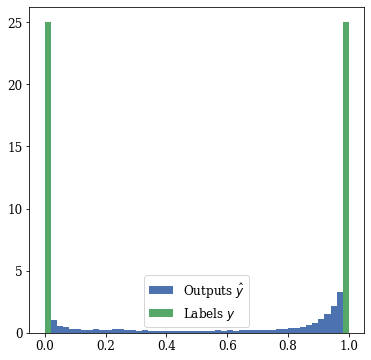

In [95]:
OUTPUTS = torch.cat(outputs).view(-1).numpy()#concatenate everything
LABELS = torch.cat(labels).view(-1).numpy()
plt.rcParams["figure.figsize"] = (6,6)
plt.hist(OUTPUTS, bins=50, density=True, label = "Outputs $\hat{y}$")
plt.hist(LABELS, bins=50,density=True, label = "Labels $y$")
plt.legend()
plt.show()



---



---


# Sanity Check

## Checking Method and Model Performance with a Gaussian Process Case Study 

### This could be in a different notebook
We can check how this method performs by generating toy data from a multivariateGaussian distributions, and go throught the chain of the whole procedure to validate this method.

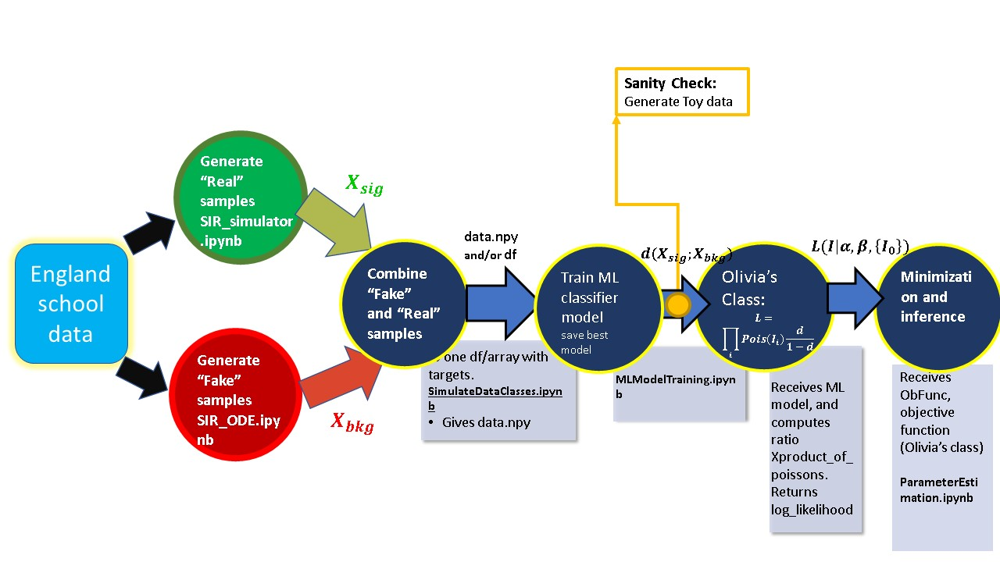

Suppose that we have a data set of observations $\mathbf{x}=\left(x_{1}, \ldots, x_{N}\right)^{\mathrm{T}}$, representing N observations of the scalar variable x.  Also, suppose that the observations are
drawn independently from a Gaussian distribution whose mean µ and variance σ2
are unknown, and we would like to determine these parameters from the data set. Since our data set $\mathbf{x}$ is iid, then the probability of the data set, given $\mu$ and $\sigma^2$ is 
$$p\left(\mathbf{x} \mid \mu, \sigma^{2}\right)=\prod_{n=1}^{N} \mathcal{N}\left(x_{n} \mid \mu, \sigma^{2}\right)$$

Hence  the Gaussian distribution defined over a D-dimensional vector x of continuous variables is called the multivariate Gaussian, and is given by

$$\mathcal{N}(\mathbf{x} \mid \boldsymbol{\mu}, \mathbf{\Sigma})=\frac{1}{(2 \pi)^{D / 2}} \frac{1}{|\mathbf{\Sigma}|^{1 / 2}} \exp \left\{-\frac{1}{2}(\mathbf{x}-\boldsymbol{\mu})^{\mathrm{T}} \mathbf{\Sigma}^{-1}(\mathbf{x}-\boldsymbol{\mu})\right\}$$
where the D-dimensional vector µ is called the mean, the D × D matrix Σ is called
the covariance, and |Σ| denotes the determinant of Σ.

if two sets of variables are jointly Gaussian, then the conditional distribution of one set
conditioned on the other is again Gaussian.

Suppose $\mathbf{x}$ is a D-dimensional
vector with Gaussian distribution $\mathcal{N}(\mathbf{x} \mid \boldsymbol{\mu}, \mathbf{\Sigma})$  and that we partition $\mathbf{x}$ into two disjoint subsets $\mathbf{x_a}$ and $\mathbf{x_b}$. Without loss of generality, we can take $\mathbf{x_a}$ to form the first M components of $\mathbf{x}$, with $\mathbf{x_b}$ comprising the remaining $(D − M)$ components, so that
$$\mathbf{x}=\left(\begin{array}{l}
\mathbf{x}_{a} \\
\mathbf{x}_{b}
\end{array}\right)$$
We also define corresponding partitions of the mean vector $\mathbf{\mu}$ given by
$$\boldsymbol{\mu}=\left(\begin{array}{l}
\boldsymbol{\mu}_{a} \\
\boldsymbol{\mu}_{b}
\end{array}\right)$$

and of the covariance matrix $\mathbf{\Sigma}$ given by
$$\Sigma=\left(\begin{array}{ll}
\Sigma_{a a} & \Sigma_{a b} \\
\Sigma_{b a} & \Sigma_{b b}
\end{array}\right)$$


If you would like to get a more intuitive idea of the multivariate gaussian, review the code and interactive 3d plot below. This produces a bivariate gaussian, where we have two features $x$ and $y$. Play with their means and variances and see how it affects the distribution (also remember that every slice on this plane is an equally probably plane)

In [ ]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

def bivar_norm_dist(mean_x, mean_y, var_x, var_y):
    
    x = np.linspace(-4, 4, 1000)
    y = np.linspace(-4, 4, 1000)    
    
    fig  = plt.figure()
    ax   = fig.gca(projection='3d')
    x, y = np.meshgrid(x, y)
    
    z = (np.e**(-(x-mean_x)**2/(2*var_x)-(y-mean_y)**2/(2*var_y)))/(var_x*var_y*2*np.pi)**0.5
    
    surf = ax.plot_surface(x, y, z, cmap=cm.viridis, linewidth=0, antialiased=False)
    ax.contour(x, y, z, cmap=cm.viridis, linewidth=0.2,linestyles="solid", offset=-0.1)
    ax.contourf(x, y, z, cmap=cm.viridis, offset=-0.1)
    ax.set_zlim(-0.1, 0.1)
    
    fig.colorbar(surf, shrink=0.5, aspect=5)

    plt.show()

In [ ]:
interact(bivar_norm_dist, mean_x=(-10,10,1), mean_y=(-10,10,1), var_x=(2,5,1), var_y=(2,5,1))

interactive(children=(IntSlider(value=0, description='mean_x', max=10, min=-10), IntSlider(value=0, descriptio…

<function __main__.bivar_norm_dist>

### Other interesting and very usefull facts about Gaussian distributions (both univariate and multivariate), especially for inference are:
* The product of Gausssiance are Gaussians

$\begin{array}{c}
\mathcal{N}(x ; a, A) \mathcal{N}(x ; b, B) \\
=\mathcal{N}(x ; c, C) \mathcal{N}(a ; b, A+B) \\
C:=\left(A^{-1}+B^{-1}\right)^{-1} \quad c:=C\left(A^{-1} a+B^{-1} b\right)
\end{array}$

* Linear projections of Gaussians are Gaussians

$p(z)=\mathcal{N}(z ; \mu, \Sigma) \rightarrow p(A z)=\mathcal{N}\left(A z, A \mu, A \Sigma A^{\top}\right)$

* Marginals of Gaussians are Gaussiance

$\int \mathcal{N}\left[\left(\begin{array}{l}
x \\
y
\end{array}\right) ;\left(\begin{array}{l}
\mu_{x} \\
\mu_{y}
\end{array}\right),\left(\begin{array}{cc}
\Sigma_{x x} & \Sigma_{x y} \\
\Sigma_{y x} & \Sigma_{y y}
\end{array}\right)\right] d y=\mathcal{N}\left(x ; \mu_{x}, \Sigma_{x \alpha}\right)$

* Conditionals of Gaussians are Gaussiancs

$p(x \mid y)=\frac{p(x, y)}{p(y)} = \mathcal{N}\left(x ; \mu_{x}+\Sigma_{x y} \Sigma_{y y}^{-1}\left(y-\mu_{y}\right), \Sigma_{x \alpha}-\Sigma_{x y} \Sigma_{y y}^{-1} \Sigma_{y x}\right)$

## Testing method with Random Toy data (not relevant to SIR)

# Generating the Toy Data for SIR

Note that there is so much one can do with Gaussian processes and Gaussian inference, this is just a simple elementary example to test the method, without doing much math.

### Recall the England school data 

In applying the above explanation and intuition to our problem, we shal now model the data as a multivariate gaussian ,where our features are $x=\{ I_1,...,I_{13} \}$ (just the counts) and hence our covariance matrix will be $13 \times 13$. The signal will be have correlated counts (and hence nonzero off diagonal elements in the covariance matrix). 

Since zero off-diagonal ekements in the covariance matrix implies independence if all other variablesa rea integrated out, the background will be uncorrelated (and hence zero off diagonal elements in its covariance matrix).

This was one vector of times and one vector of infected counts, each of size 13. Specifically, they are given in the cell below

(array([5., 0., 2., 0., 1., 0., 1., 2., 1., 1.]),
 array([  3. ,  32.3,  61.6,  90.9, 120.2, 149.5, 178.8, 208.1, 237.4,
        266.7, 296. ]),
 <a list of 1 Patch objects>)

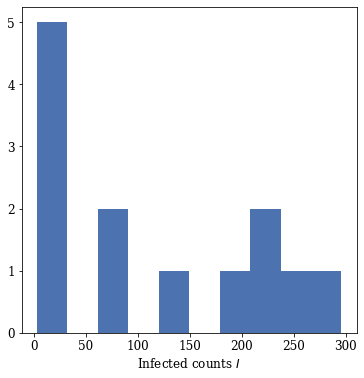

In [96]:
import numpy as np
alpha = 0.465 
beta = 0.00237 
tdata0 = np.array([1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]) -1 
ydata0 = np.array([3, 25, 75, 227, 296, 258, 236, 192, 126, 71, 28, 11, 7])

alphaRange = [alpha*0.01,alpha*1.99]
betaRange = [beta*0.01,beta*1.99]
s0mean = 763; #763 - boarding school value
i0mean = 3;
r0mean = 0;
init_mean = np.array([s0mean,i0mean,r0mean])

plt.xlabel('Infected counts $I$')
plt.hist(ydata0, histtype='stepfilled')

This is all the (real world) data that we have. We built a model to model this data as the signal samples using the stochastic method. This shall be our signal ("real") class samples. 


$\textbf{Signal:}$

We generate the data such that the signal, i.e. real counts comes from a multivariate Gaussian where the mean of the counts comes from height of the real data (of the infected counts from England) if it were modeled as a Gaussian. The correlation matrix can be invented (ideally it comes from the signal data), such that we have correlated (dependent) features
$$\Sigma_{signal}=\left(\begin{array}{ll}
\Sigma_{a a}^{\text{Stochastic}} & \Sigma_{a b}^{\text{Stochastic}} \\
\Sigma_{b a}^{\text{Stochastic}} & \Sigma_{b b}^{\text{Stochastic}}
\end{array}\right)$$


$\textbf{Background:}$

We generate the background ("fake data") from a multigaussian where the mean of the counts comes from solving the differential equation. In contrast to the signal, the background has no correlation (independent)
$$ \Sigma_{background}=\left(\begin{array}{ll}
\Sigma_{a a}^{\text{ODE}} & 0 \\
0 & \Sigma_{b b}^{\text{ODE}}
\end{array}\right)$$
Similarly, the mean vector for each class was generated in a similar fashion.



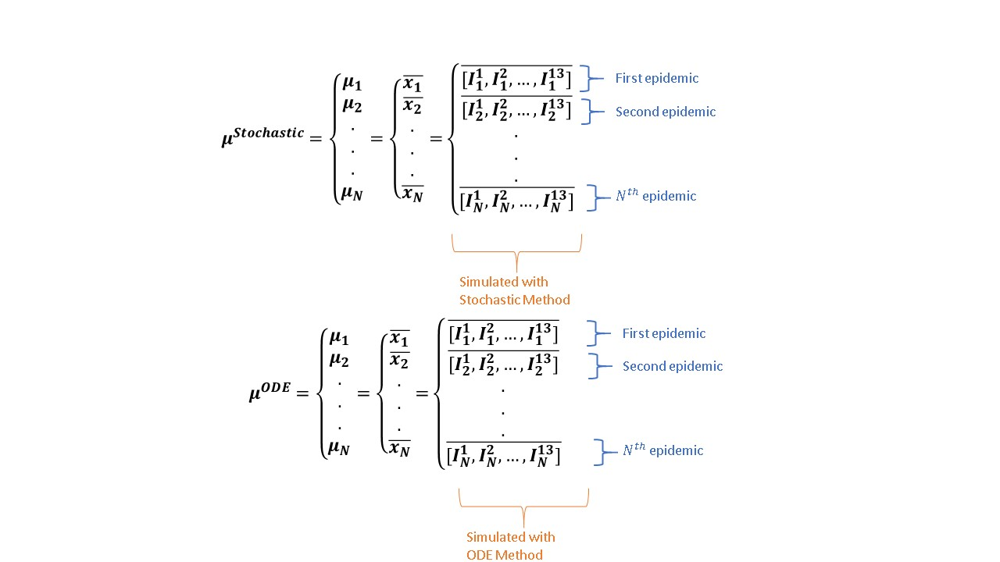

In building the Multivariate Gaussian (toy data) that is roughly like the data that we have, we thus follow the following steps:


1. Generate Signal Multivariate Gaussian (toy data)
2. Generate Background Multivariate Gaussian (toy data)
3. Go through ML procedure
4. Approximate the likelihood of the Signal toy data.
5. Compapre the likelihood (in step 4) to the MVN toy signal data, to evaluate how well the likelihood is approximated.
$

What if we have negative counts? For the time being we don't worry about that (we accept negative counts for now.)

In [7]:
sig = io[io[:, -1] > 0.5]
bkg = io[io[:, -1] < 0.5]

#Take only infected counts as our feature vectors
sig_data=sig[:,2:-1]; sig_data
bkg_data=bkg[:,2:-1]; bkg_data

array([[  7.,  46., 166., ..., 301., 315., 275.],
       [  2., 185., 339., ...,   2.,   1.,   3.],
       [  3., 100., 249., ...,   1.,   2.,   0.],
       ...,
       [  3.,   6.,   5., ...,   6.,   3.,   5.],
       [  3.,  24.,  98., ..., 103.,  76.,  46.],
       [  3.,  42., 116., ...,  32.,  14.,  14.]])

In [98]:
sig_data.shape

(50000, 13)

so we have our features vector (sometimes denoted as $\Phi_X$ in Gaussian inference) has 13 columns

Get the mean vectors $\mathbf{\mu}$ for signal and background. (this is the sample mean across each column -> Gives use a mean vector of size 13. 

In [99]:
def mean_vector(X):
  m, n = X.shape
  mean = X.mean(axis=0)
  return mean
mean_vec_sig = mean_vector(sig_data); mean_vec_sig

array([  3.     , 101.05642, 189.10672, 211.10698, 200.90628, 181.44848,
       161.2264 , 142.95294, 127.19228, 113.82852, 102.53698,  92.94048,
        84.7145 ])

In [100]:
mean_vec_sig.shape

(13,)

Now do it for the background

In [101]:
mean_vec_bkg = mean_vector(bkg_data); mean_vec_bkg

array([  3.01264, 111.27406, 202.04388, 219.80986, 206.88184, 186.06804,
       164.7658 , 145.83624, 129.51386, 115.81194, 104.2831 ,  94.39912,
        86.07606])

In [102]:
mean_vec_bkg.shape

(13,)

Calculate the covariance matrix $\Sigma$ for signal and background. (We get $\Sigma^{Signal}$ from the signal features vector $X_{Sig}$, and we add noise to it.

In [103]:
def covariance_matrix(X):
    m, n = X.shape 
    mean = X.mean(axis=0)
    cov_matrix = (X - mean).T.dot((X - mean)) / m-1
    np.random.seed(2020)
    return cov_matrix + 0.00001 * np.random.rand(n,n)

#The covariance matrix for our signal toy data comes from the signal data
cov_mat_sig = np.array(covariance_matrix(sig_data))

In [104]:
cov_mat_sig

array([[-9.99990137e-01, -9.99991266e-01, -9.99994903e-01,
        -9.99997282e-01, -9.99996631e-01, -9.99997830e-01,
        -9.99997235e-01, -9.99996567e-01, -9.99991378e-01,
        -9.99998433e-01, -9.99998591e-01, -9.99992429e-01,
        -9.99992637e-01],
       [-9.99996443e-01,  1.91677949e+04,  2.55047723e+04,
         1.99724598e+04,  1.44282826e+04,  1.06477891e+04,
         8.19822853e+03,  6.58448444e+03,  5.48988517e+03,
         4.72001742e+03,  4.15370421e+03,  3.72209876e+03,
         3.37813107e+03],
       [-9.99999658e-01,  2.55047723e+04,  4.27610675e+04,
         3.89372866e+04,  3.04423179e+04,  2.34201320e+04,
         1.84389355e+04,  1.49792461e+04,  1.25567393e+04,
         1.08058280e+04,  9.50090930e+03,  8.49524206e+03,
         7.69590813e+03],
       [-9.99991508e-01,  1.99724598e+04,  3.89372866e+04,
         4.25528666e+04,  3.79502213e+04,  3.18161896e+04,
         2.64780134e+04,  2.23035647e+04,  1.91342591e+04,
         1.67040723e+04,  1.48177563e

In [105]:
cov_mat_sig.shape, cov_mat_sig[0]

((13, 13),
 array([-0.99999014, -0.99999127, -0.9999949 , -0.99999728, -0.99999663,
        -0.99999783, -0.99999724, -0.99999657, -0.99999138, -0.99999843,
        -0.99999859, -0.99999243, -0.99999264]))

So the shape of $\Sigma^{Sig}$ is $13 \times 13$.

Now let's do the covariance matrix for the backround. Below is the full covariance matrix using $X^{Bkg}$

In [106]:
cov_mat_bkg_full = np.array(covariance_matrix(bkg_data)); cov_mat_bkg_full

array([[ 2.00437009e+00, -6.48635384e-01, -1.08854955e+00,
        -8.98833912e-01, -1.97563088e-01,  1.76422144e-01,
         1.71830528e-02, -3.64926640e-01, -5.95986569e-01,
        -8.09141355e-01, -9.15736975e-01, -9.01097306e-01,
        -8.68434035e-01],
       [-6.48640562e-01,  2.01378892e+04,  2.71504040e+04,
         2.12978117e+04,  1.54127277e+04,  1.14248817e+04,
         8.81560941e+03,  7.12999289e+03,  5.99707813e+03,
         5.20740843e+03,  4.61001230e+03,  4.17153542e+03,
         3.81755242e+03],
       [-1.08855430e+00,  2.71504040e+04,  4.37944390e+04,
         3.90910655e+04,  3.05528538e+04,  2.35867061e+04,
         1.85844247e+04,  1.51737711e+04,  1.27782530e+04,
         1.10458333e+04,  9.74693800e+03,  8.77332425e+03,
         7.98837924e+03],
       [-8.98828138e-01,  2.12978117e+04,  3.90910655e+04,
         4.18149186e+04,  3.71800282e+04,  3.14668390e+04,
         2.63879553e+04,  2.24211715e+04,  1.93533392e+04,
         1.69855757e+04,  1.51372962e

But for the background we want zero off-diagonals (for it to be uncorrelated). Find the diagonal of this matrix (which are the standard deviations of each feature) 

In [107]:
cov_mat_bkg_full_diag = cov_mat_bkg_full.diagonal()
cov_mat_bkg_full_diag

array([2.00437009e+00, 2.01378892e+04, 4.37944390e+04, 4.18149186e+04,
       3.77227224e+04, 3.48421739e+04, 3.25015448e+04, 3.04596560e+04,
       2.84867729e+04, 2.66548480e+04, 2.49813805e+04, 2.33604480e+04,
       2.18519142e+04])

Construct $13 \times 13$ matrix filled with zeros

In [108]:
cov_mat_bkg = np.zeros((13,13)); cov_mat_bkg

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

Fill this zeros matrix with the main diagonal from  $\Sigma^{Bkg}$

In [109]:
diag_list = cov_mat_bkg_full_diag.tolist()
np.fill_diagonal(cov_mat_bkg, diag_list); cov_mat_bkg

array([[2.00437009e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00],
       [0.00000000e+00, 2.01378892e+04, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 4.37944390e+04, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 4.18149186e+04,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+

Make a function that extracts the samples from a multivariate Gaussian, given a $\Sigma$ matrix and a $\mu$ vector

$|\Sigma|=d\times d=13 \times 13$,  $|X|=|\mu| = n \times d$ are the dimensions, so that $(x-\mu) \Sigma (x-\mu)^T$ works

In [110]:
d=13 #this has to be 13 since
n=100000 #number of samples, could be anything

def get_mvn_samples(mu,cov,n,d):
    samples = np.zeros((n,d))
    for i in range(n):      
        samples[i,:] = np.random.multivariate_normal(mu, cov, 1)
    
    return samples


In [111]:
sig_mvn = get_mvn_samples(mu=mean_vec_sig, cov=cov_mat_sig, n=100000, d=13); sig_mvn

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning:

covariance is not positive-semidefinite.



array([[   2.58541769,  189.96852773,  440.30627436, ...,   19.28677133,
           9.17624971,   -8.43601026],
       [   2.30957411,  187.6140112 ,  354.26275339, ...,  192.00862938,
         175.1212581 ,  162.80296648],
       [   2.05384803,  212.30907465,  383.31879553, ...,  121.98575052,
          96.7601958 ,   86.74958772],
       ...,
       [   3.13052887,  -86.84746471,   62.10153337, ...,  211.61138435,
         223.62677136,  222.62687512],
       [   3.64079134,  -41.44532672,   26.54254144, ...,  138.86013271,
         136.44940277,  154.887318  ],
       [   2.8305286 ,  205.65705293,  179.18111177, ..., -148.11115764,
        -171.19485141, -193.99955162]])

In [112]:
bkg_mvn = get_mvn_samples(mu=mean_vec_bkg, cov=cov_mat_bkg, n=100000, d=13)

If we just flatten everything as to view it as just a distribution over the infected counts $I$ (over many epidemics), then we get a distribution that looks like

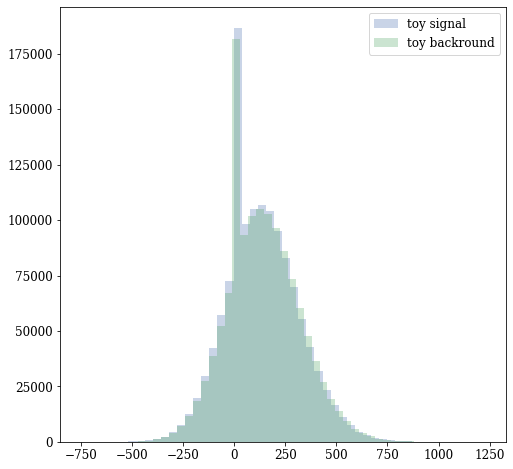

In [39]:
plt.hist(sig_mvn.ravel(), bins=50, alpha=0.3, label='toy signal')
plt.hist(bkg_mvn.ravel(), bins=50, alpha=0.3, label='toy backround')
plt.legend()
plt.show()

## Create a targets column for each of the signal and background toy samples

In [113]:
sig_mvn.shape

(100000, 13)

In [114]:
sig_mvn = np.hstack((sig_mvn,np.ones((sig_mvn.shape[0],1))))
sig_mvn[:,-1]

array([1., 1., 1., ..., 1., 1., 1.])

In [115]:
bkg_mvn = np.hstack((bkg_mvn,np.zeros((bkg_mvn.shape[0],1))))
bkg_mvn[:,-1]

array([0., 0., 0., ..., 0., 0., 0.])

Create the features array for both signal and background by adding the signal and background features row-wise

In [116]:
X_toy = np.vstack((sig_mvn, bkg_mvn))
X_toy

array([[   2.58541769,  189.96852773,  440.30627436, ...,    9.17624971,
          -8.43601026,    1.        ],
       [   2.30957411,  187.6140112 ,  354.26275339, ...,  175.1212581 ,
         162.80296648,    1.        ],
       [   2.05384803,  212.30907465,  383.31879553, ...,   96.7601958 ,
          86.74958772,    1.        ],
       ...,
       [   2.62317389,   18.57492576,  283.39252164, ...,  203.60589388,
         320.84951437,    0.        ],
       [   3.46286304,  384.43953767,  162.7429307 , ...,   -3.3731716 ,
         163.34580289,    0.        ],
       [   3.83665444,   40.8296136 , -138.34846224, ...,  115.74382413,
          -2.7254594 ,    0.        ]])

Define the targets column for the toy data


In [117]:
y_toy = X_toy[:,-1]
y_toy

array([1., 1., 1., ..., 0., 0., 0.])

In [118]:
X_toy[:,-1] #check the last column

array([1., 1., 1., ..., 0., 0., 0.])

In [119]:
X_toy = X_toy[:, :-1]

Make sure that the last column is a features column and not targets

In [121]:
X_toy[:,-1]

array([ -8.43601026, 162.80296648,  86.74958772, ..., 320.84951437,
       163.34580289,  -2.7254594 ])

In [122]:
n_samples, n_features = X_toy.shape
n_samples, n_features

(200000, 13)

In [123]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
ntargets = 1
train_data, test_data, train_targets, test_targets = train_test_split(X_toy, 
                                                                      y_toy, 
                                                                      stratify=y_toy)
#Reshape the targets to have shape (something, 1)
train_targets = train_targets.reshape(-1,1)
test_targets = test_targets.reshape(-1,1)
test_targets

array([[0.],
       [0.],
       [0.],
       ...,
       [1.],
       [0.],
       [1.]])

In [124]:
sc = StandardScaler()
train_data= sc.fit_transform(train_data)
test_data = sc.transform(test_data)

In [125]:
train_dataset = CustomDataset(train_data, train_targets)
test_dataset = CustomDataset(test_data, test_targets)

In [126]:
train_dataset[0]

{'x': tensor([-1.6449, -0.5581, -0.2411, -0.2446, -0.1149,  0.0796,  0.2561,  0.2958,
          0.3759,  0.3656,  0.3375,  0.3084,  0.2515]), 'y': tensor([1.])}

In [127]:
train_targets.shape

(150000, 1)

In [128]:
train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=10, 
                                           num_workers=2, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(test_dataset, 
                                          batch_size=10, num_workers=2)

### Create a Study

In [60]:
study = optuna.create_study(direction="minimize")#define a direction; in this case we are minimizing the loss
study.optimize(objective, n_trials=5)

best_trial = study.best_trial
#print("best trial" % best_trial)
print(best_trial.values)
print(best_trial.params)

score = perform_training(params=best_trial.params, save_model=False)
print(score)

[I 2021-06-09 23:06:37,127] A new study created in memory with name: no-name-af30bd62-20cc-4fdd-8848-e9beef4490e0


Epoch : 0         , Training Loss: 4.11663e-05, Test Loss: 0.000183652
Epoch : 1         , Training Loss: 5.03365e-05, Test Loss: 0.000178986
Epoch : 2         , Training Loss: 4.99816e-05, Test Loss: 0.000179067
Epoch : 3         , Training Loss: 4.14358e-05, Test Loss: 0.00017266
Epoch : 4         , Training Loss: 4.50622e-05, Test Loss: 0.000167593
Epoch : 5         , Training Loss: 5.13603e-05, Test Loss: 0.000168262
Epoch : 6         , Training Loss: 5.15622e-05, Test Loss: 0.000163766
Epoch : 7         , Training Loss: 4.79831e-05, Test Loss: 0.000159699
Epoch : 8         , Training Loss: 4.09675e-05, Test Loss: 0.000162379
Epoch : 9         , Training Loss: 4.36478e-05, Test Loss: 0.000156722
Epoch : 10        , Training Loss: 4.05544e-05, Test Loss: 0.00015784
Epoch : 11        , Training Loss: 4.81964e-05, Test Loss: 0.000158087
Epoch : 12        , Training Loss: 4.59573e-05, Test Loss: 0.000152294
Epoch : 13        , Training Loss: 4.94742e-05, Test Loss: 0.000153962
Epoch : 

[I 2021-06-09 23:06:39,864] Trial 0 finished with value: 0.00014522088766098022 and parameters: {'num_layers': 3, 'hidden_size': 238, 'dropout': 0.2172914058328963, 'learning_rate': 0.00040619469392111016}. Best is trial 0 with value: 0.00014522088766098022.


Epoch : 21        , Training Loss: 4.16673e-05, Test Loss: 0.000145496
Epoch : 0         , Training Loss: 4.06989e-05, Test Loss: 0.000169944
Epoch : 1         , Training Loss: 3.99264e-05, Test Loss: 0.00017277
Epoch : 2         , Training Loss: 4.52501e-05, Test Loss: 0.000171424
Epoch : 3         , Training Loss: 4.50671e-05, Test Loss: 0.000166618
Epoch : 4         , Training Loss: 4.52579e-05, Test Loss: 0.000171636
Epoch : 5         , Training Loss: 4.47303e-05, Test Loss: 0.000159696
Epoch : 6         , Training Loss: 5.13579e-05, Test Loss: 0.000176281
Epoch : 7         , Training Loss: 4.79224e-05, Test Loss: 0.000165098
Epoch : 8         , Training Loss: 5.29437e-05, Test Loss: 0.000174028
Epoch : 9         , Training Loss: 4.04214e-05, Test Loss: 0.000168685
Epoch : 10        , Training Loss: 4.13212e-05, Test Loss: 0.000172764
Epoch : 11        , Training Loss: 4.54988e-05, Test Loss: 0.000170216
Epoch : 12        , Training Loss: 4.78522e-05, Test Loss: 0.000169551


[I 2021-06-09 23:06:41,593] Trial 1 finished with value: 0.0001596964120864868 and parameters: {'num_layers': 9, 'hidden_size': 105, 'dropout': 0.5407580114516418, 'learning_rate': 0.00034970676282861666}. Best is trial 0 with value: 0.00014522088766098022.


Epoch : 13        , Training Loss: 4.58897e-05, Test Loss: 0.000167384
Epoch : 0         , Training Loss: 3.88397e-05, Test Loss: 0.000189113
Epoch : 1         , Training Loss: 5.4574e-05, Test Loss: 0.000190279
Epoch : 2         , Training Loss: 4.44361e-05, Test Loss: 0.000190427
Epoch : 3         , Training Loss: 5.26438e-05, Test Loss: 0.000177592
Epoch : 4         , Training Loss: 4.94922e-05, Test Loss: 0.000180559
Epoch : 5         , Training Loss: 5.85204e-05, Test Loss: 0.000185496
Epoch : 6         , Training Loss: 5.64922e-05, Test Loss: 0.000182944
Epoch : 7         , Training Loss: 4.18865e-05, Test Loss: 0.000176851
Epoch : 8         , Training Loss: 5.16613e-05, Test Loss: 0.00017948
Epoch : 9         , Training Loss: 5.01684e-05, Test Loss: 0.000178046
Epoch : 10        , Training Loss: 4.79276e-05, Test Loss: 0.000171339
Epoch : 11        , Training Loss: 4.08455e-05, Test Loss: 0.000174991
Epoch : 12        , Training Loss: 4.47103e-05, Test Loss: 0.000178834
Epoch : 

[I 2021-06-09 23:06:44,804] Trial 2 finished with value: 0.0001713391065597534 and parameters: {'num_layers': 9, 'hidden_size': 467, 'dropout': 0.31247877314760375, 'learning_rate': 0.00014521629124166418}. Best is trial 0 with value: 0.00014522088766098022.


Epoch : 14        , Training Loss: 4.52213e-05, Test Loss: 0.000173833
Epoch : 0         , Training Loss: 5.02948e-05, Test Loss: 0.000189312
Epoch : 1         , Training Loss: 4.88732e-05, Test Loss: 0.000173729
Epoch : 2         , Training Loss: 4.58004e-05, Test Loss: 0.000177801
Epoch : 3         , Training Loss: 5.37416e-05, Test Loss: 0.000165947
Epoch : 4         , Training Loss: 4.39497e-05, Test Loss: 0.000165927
Epoch : 5         , Training Loss: 4.29395e-05, Test Loss: 0.000170142
Epoch : 6         , Training Loss: 4.57024e-05, Test Loss: 0.000166674
Epoch : 7         , Training Loss: 4.1081e-05, Test Loss: 0.00015955
Epoch : 8         , Training Loss: 5.05559e-05, Test Loss: 0.000157095
Epoch : 9         , Training Loss: 4.37477e-05, Test Loss: 0.000158615
Epoch : 10        , Training Loss: 4.9071e-05, Test Loss: 0.000154572
Epoch : 11        , Training Loss: 4.03117e-05, Test Loss: 0.000152846
Epoch : 12        , Training Loss: 4.35252e-05, Test Loss: 0.000152905
Epoch : 1

[I 2021-06-09 23:06:47,557] Trial 3 finished with value: 0.00014175008535385132 and parameters: {'num_layers': 2, 'hidden_size': 421, 'dropout': 0.5044602828944336, 'learning_rate': 0.0004322713960885482}. Best is trial 3 with value: 0.00014175008535385132.


Epoch : 21        , Training Loss: 4.3024e-05, Test Loss: 0.00014175
Epoch : 0         , Training Loss: 4.71307e-05, Test Loss: 0.000182728
Epoch : 1         , Training Loss: 3.52136e-05, Test Loss: 0.000165918
Epoch : 2         , Training Loss: 4.59646e-05, Test Loss: 0.000150782
Epoch : 3         , Training Loss: 5.00616e-05, Test Loss: 0.000144187
Epoch : 4         , Training Loss: 4.74393e-05, Test Loss: 0.000140525
Epoch : 5         , Training Loss: 4.73551e-05, Test Loss: 0.000137787
Epoch : 6         , Training Loss: 4.05297e-05, Test Loss: 0.000136187
Epoch : 7         , Training Loss: 4.10504e-05, Test Loss: 0.000135427
Epoch : 8         , Training Loss: 3.80521e-05, Test Loss: 0.000134608
Epoch : 9         , Training Loss: 3.90445e-05, Test Loss: 0.000134752
Epoch : 10        , Training Loss: 3.61717e-05, Test Loss: 0.000134741
Epoch : 11        , Training Loss: 3.78453e-05, Test Loss: 0.000134085
Epoch : 12        , Training Loss: 3.50764e-05, Test Loss: 0.000134232
Epoch : 

[I 2021-06-09 23:06:52,279] Trial 4 finished with value: 0.00013246729373931886 and parameters: {'num_layers': 2, 'hidden_size': 1264, 'dropout': 0.12123143015973231, 'learning_rate': 0.0003294705341087694}. Best is trial 4 with value: 0.00013246729373931886.


Epoch : 21        , Training Loss: 3.86609e-05, Test Loss: 0.000132686
[0.00013246729373931886]
{'num_layers': 2, 'hidden_size': 1264, 'dropout': 0.12123143015973231, 'learning_rate': 0.0003294705341087694}
Epoch : 0         , Training Loss: 4.45295e-05, Test Loss: 0.000174205
Epoch : 1         , Training Loss: 4.20212e-05, Test Loss: 0.000161665
Epoch : 2         , Training Loss: 5.35773e-05, Test Loss: 0.000148706
Epoch : 3         , Training Loss: 4.14622e-05, Test Loss: 0.00014171
Epoch : 4         , Training Loss: 3.7764e-05, Test Loss: 0.00013785
Epoch : 5         , Training Loss: 5.03249e-05, Test Loss: 0.000135885
Epoch : 6         , Training Loss: 4.42371e-05, Test Loss: 0.00013458
Epoch : 7         , Training Loss: 3.88718e-05, Test Loss: 0.00013433
Epoch : 8         , Training Loss: 4.6165e-05, Test Loss: 0.00013362
Epoch : 9         , Training Loss: 4.16933e-05, Test Loss: 0.000132937
Epoch : 10        , Training Loss: 3.88199e-05, Test Loss: 0.00013289
Epoch : 11        , 

In [ ]:
# #ytrain.view()
# ytrain= ytrain.reshape(-1,1)
#drop dropout after evaluating
# ytrain.shape
model =  Model(nfeatures=xtrain.shape[1], ntargets=1,
               nlayers=15, hidden_size=128, dropout=0.3)
#print(model)

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

eng = Engine(model=model, optimizer = optimizer)
best_loss = np.inf
early_stopping_iter = 10
early_stopping_counter = 0
EPOCHS=50

In [ ]:
for epoch in range(EPOCHS):
    train_loss = eng.train(train_loader)
    test_loss = eng.train(test_loader)
    print("Epoch : %-10g, Training Loss: %-10g, Test Loss: %-10g" % (epoch, train_loss, test_loss))
    #print(f"{epoch}, {train_loss}, {test_loss}")
    if test_loss < best_loss:
        best_loss = test_loss
        
    else:
        early_stopping_counter += 1
    
    if early_stopping_counter > early_stopping_iter:
        #if we are not improving for 10 iterations then break the loop
        #we could save best model here
        break

Epoch : 0         , Training Loss: 5.39683e-05, Test Loss: 0.00019005
Epoch : 1         , Training Loss: 5.02596e-05, Test Loss: 0.000189048
Epoch : 2         , Training Loss: 4.71321e-05, Test Loss: 0.000184452
Epoch : 3         , Training Loss: 4.60835e-05, Test Loss: 0.000184007
Epoch : 4         , Training Loss: 4.97946e-05, Test Loss: 0.000175709
Epoch : 5         , Training Loss: 4.85628e-05, Test Loss: 0.000173627
Epoch : 6         , Training Loss: 5.01319e-05, Test Loss: 0.000176892
Epoch : 7         , Training Loss: 4.74712e-05, Test Loss: 0.000170257
Epoch : 8         , Training Loss: 4.3954e-05, Test Loss: 0.000167866
Epoch : 9         , Training Loss: 4.10216e-05, Test Loss: 0.000175016
Epoch : 10        , Training Loss: 5.02852e-05, Test Loss: 0.000165997
Epoch : 11        , Training Loss: 4.50076e-05, Test Loss: 0.000162824
Epoch : 12        , Training Loss: 5.42535e-05, Test Loss: 0.000165379
Epoch : 13        , Training Loss: 5.51903e-05, Test Loss: 0.000159815
Epoch : 

In [ ]:
outputs = []
labels = []
accuracies = []

#evaluate
with torch.no_grad():
    for data in test_loader:
        data_cp = copy.deepcopy(data)
        
        xtest = data_cp["x"]
        ytest = data_cp["y"]
        output = model(xtest)
        labels.append(ytest)
        outputs.append(output)
        
        y_predicted_cls = output.round()
        acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])#bumber of correct predictions/sizeofytest
        #accuracies.append(acc.numpy())
        #print(f'accuracy: {acc.item():.4f}')
        
        del data_cp

#     acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])
#     print(f'accuracy: {acc.item():.4f}')

In [ ]:
OUTPUTS = torch.cat(outputs).view(-1).numpy()#concatenate everything

LABELS = torch.cat(labels).view(-1).numpy()
OUTPUTS, LABELS

(array([0.16219474, 0.11842311, 0.09649224, ..., 0.14831375, 0.12234575,
        0.10028929], dtype=float32),
 array([0., 0., 0., ..., 1., 0., 1.], dtype=float32))

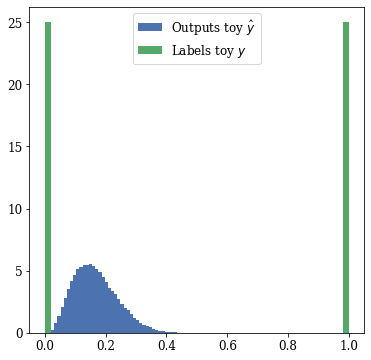

In [ ]:
plt.rcParams["figure.figsize"] = (6,6)
plt.hist(OUTPUTS, bins=50, density=True, label = "Outputs toy $\hat{y}$")
plt.hist(LABELS, bins=50,density=True, label = "Labels toy $y$")
plt.legend()
plt.show()

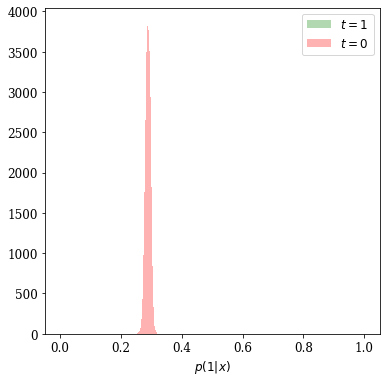

In [ ]:
p_toy = compute_prob(model, test_data)

plt.rcParams["figure.figsize"] = (6,6)
plt.hist(p_toy[p_toy>0.5], bins=50, color='g',
            histtype='stepfilled',
            alpha=0.3,label = '$t = 1$')
plt.hist(p_toy[p_toy<0.5], bins=50, color='r',
            histtype='stepfilled',
            alpha=0.3,label = '$t = 0$')
plt.xlabel('$p(y=1|x)$', fontsize=FONTSIZE)
plt.legend()

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# calculate scores
auc = roc_auc_score(LABELS, OUTPUTS)

print(' ROC AUC=%.3f' % (auc))

 ROC AUC=0.496


In [ ]:
p_toy.shape, p_toy

((50000,),
 array([0.28704184, 0.28629658, 0.29361817, ..., 0.27736655, 0.30299875,
        0.29399204], dtype=float32))

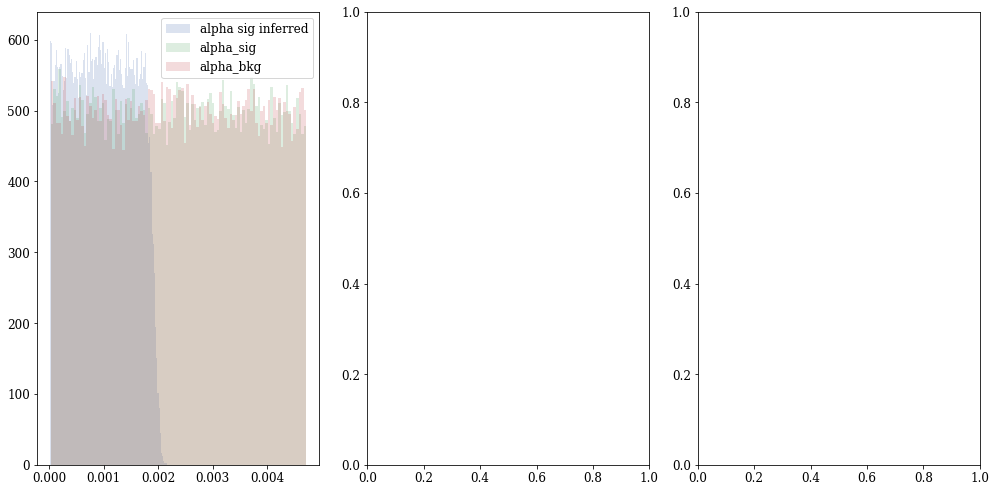

In [ ]:
ratio = p_toy/(1-p_toy)

#ratio = OUTPUTS/(1-OUTPUTS)

sig = io[io[:, -1] > 0.5]
bkg = io[io[:, -1] < 0.5]

#alpha is 0th column, beta is 1st column, infected is 2:-1-th columns
alpha_sig = sig[:p_toy.shape[0],0]

alpha_bkg = bkg[:p_toy.shape[0],0]

alpha_sig_inferred = alpha_bkg * ratio

import matplotlib.pyplot as plt #without inline
fig, axes = plt.subplots(nrows=1,ncols=3, figsize=(16,8)) 
ax1, ax2, ax3 = axes.flatten()

ax1.hist(alpha_sig_inferred, bins=100, alpha=0.2, label = 'alpha sig inferred')
ax1.hist(alpha_sig, bins=100, alpha=0.2, label='alpha_sig')

ax1.hist(alpha_bkg, bins=100, alpha=0.2, label='alpha_bkg')
ax1.set_xlabel(r'$\alpha$')
ax1.legend()


ax1.hist(alpha_sig_inferred, bins=100, alpha=0.2, label = 'alpha sig inferred')
ax1.hist(alpha_sig, bins=100, alpha=0.2, label='alpha_sig')

ax1.hist(alpha_bkg, bins=100, alpha=0.2, label='alpha_bkg')
ax1.set_xlabel(r'$\alpha$')
ax1.legend()
plt.tight_layout()

In [ ]:
sig[:,0]

(50000,)

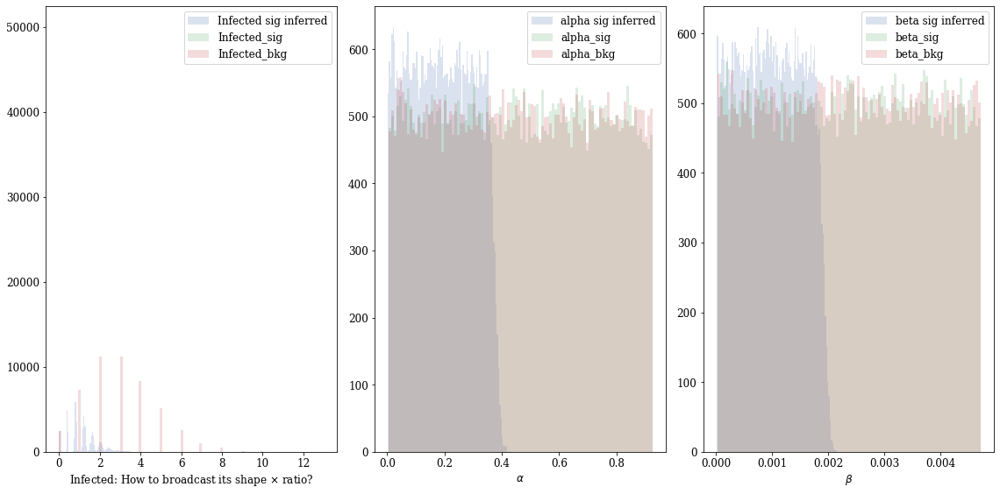

In [ ]:
import matplotlib.pyplot as plt #without inline

ratio = p_toy/(1-p_toy)

#alpha is 0th column, beta is 1st column, infected is 2:-1-th columns

Infected_sig = sig[:p_toy.shape[0],2]
Infected_bkg = bkg[:p_toy.shape[0],2]
Infected_sig_inferred = Infected_bkg * ratio

alpha_sig = sig[:p_toy.shape[0],0]
alpha_bkg = bkg[:p_toy.shape[0],0]
alpha_sig_inferred = alpha_bkg * ratio

beta_sig = sig[:p_toy.shape[0],1]
beta_bkg = bkg[:p_toy.shape[0],1]
beta_sig_inferred = beta_bkg * ratio

fig, axes = plt.subplots(nrows=1,ncols=3, figsize=(16,8)) 
ax1, ax2, ax3 = axes.flatten()


# labels_dict = {'Infected':0, 'alpha':1, 'beta':2}
# for key, value in labels_dict.items():
    
#     axes[0,value].hist()
ax1.hist(Infected_sig_inferred.flatten(), bins=100, alpha=0.2, label = 'Infected sig inferred')
ax1.hist(Infected_sig.flatten(), bins=100, alpha=0.2, label='Infected_sig')

ax1.hist(Infected_bkg.flatten(), bins=100, alpha=0.2, label='Infected_bkg')
ax1.set_xlabel(r'Infected: How to broadcast its shape $\times$ ratio?')
ax1.legend()

ax2.hist(alpha_sig_inferred, bins=100, alpha=0.2, label = 'alpha sig inferred')
ax2.hist(alpha_sig, bins=100, alpha=0.2, label='alpha_sig')
ax2.hist(alpha_bkg, bins=100, alpha=0.2, label='alpha_bkg')

ax2.set_xlabel(r'$\alpha$')
ax2.legend()

ax3.hist(beta_sig_inferred, bins=100, alpha=0.2, label = 'beta sig inferred')
ax3.hist(beta_sig, bins=100, alpha=0.2, label='beta_sig')
ax3.hist(beta_bkg, bins=100, alpha=0.2, label='beta_bkg')

ax3.set_xlabel(r'$\beta$')
ax3.legend()


plt.tight_layout()
plt.show()

### But the only thing we can truly compare to is the recoreded infected counts from the England School data!

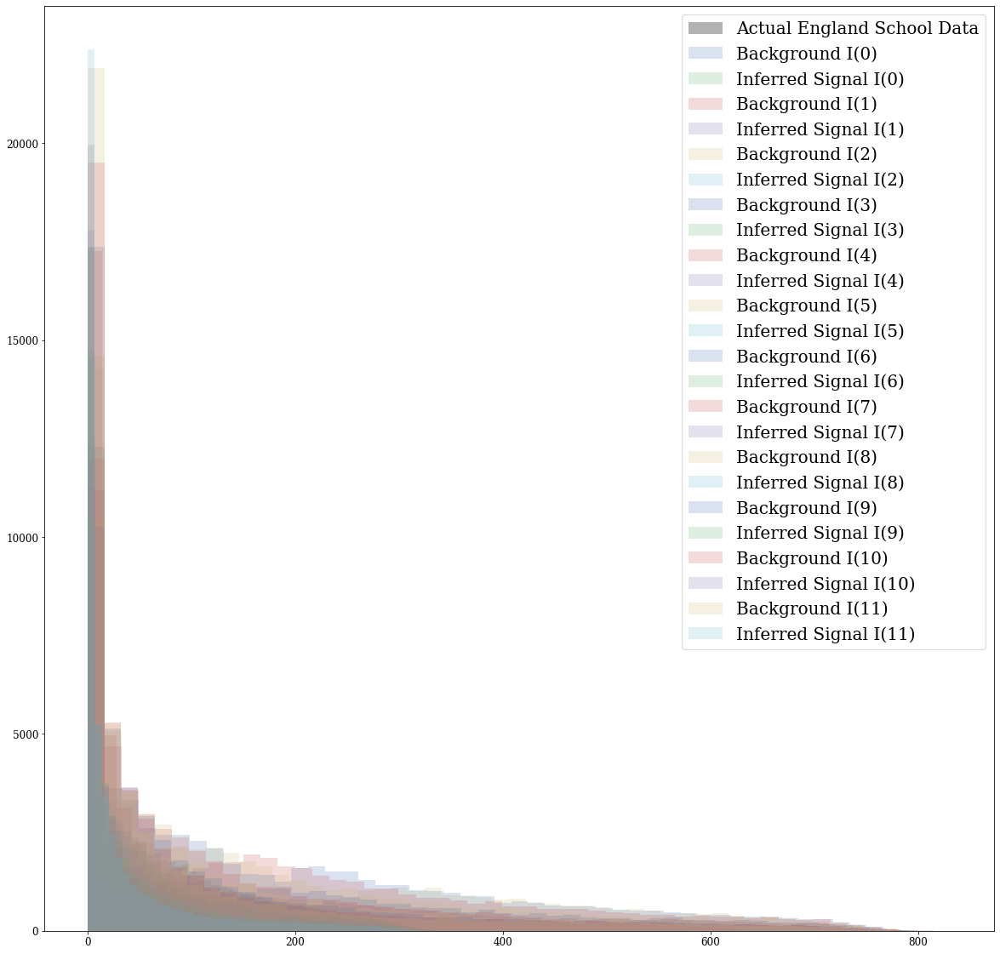

In [ ]:
ydata0 = np.array([3, 25, 75, 227, 296, 258, 236, 192, 126, 71, 28, 11, 7])
plt.figure(figsize=(20, 20))

plt.hist(ydata0, bins=50, alpha=0.3, label='Actual England School Data', color='black')

for i in range(0,12):
    #plt.hist(sig[:p_toy.shape[0],2+i], label='Signal I('+str(i)+')', bins=50, alpha=0.2)
    plt.hist(bkg[:p_toy.shape[0],2+i], label='Background I('+str(i)+')', bins=50, alpha=0.2)
    plt.hist(bkg[:p_toy.shape[0],2+i] * ratio, label='Inferred Signal I('+str(i)+')', bins=50, alpha=0.2)
plt.legend(loc='best', fontsize=20)
# Infected_sig = sig[:p_toy.shape[0],2:-1].flatten()
# Infected_bkg = bkg[:p_toy.shape[0],2:-1].flatten()
# Infected_sig_inferred = Infected_bkg * ratio


In [ ]:
ydata0.shape

(13,)

## Alternative way of generating signal toy data
The second way we could do this is if we have the mean vector for the signal be the actual (England school data) infected counts themselves, and the covariance matrix be  completely invented.


In [173]:
mean_vec_sig2 = ydata0

cov_mat_sig2 = cov_mat_sig

In [174]:
sig_mvn2 = get_mvn_samples(mu=mean_vec_sig2, cov=cov_mat_sig2, n=50000, d=13); sig_mvn2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning:

covariance is not positive-semidefinite.



array([[ 3.08038411e+00,  9.97005952e+01, -4.82162167e+01, ...,
         3.56267440e+01,  2.07650901e+01,  1.86954493e+01],
       [ 3.67863414e+00, -1.37215184e+01,  1.54067569e+02, ...,
         8.26849016e+01,  6.93044251e+01,  6.90269715e+01],
       [ 1.71163361e+00,  3.63871323e+01, -3.19250164e+01, ...,
        -1.09129630e+02, -1.33451746e+02, -1.29473517e+02],
       ...,
       [ 3.58657414e+00, -9.71223972e+01, -1.01419138e-01, ...,
        -8.71546479e+00, -4.68459765e+01, -6.44695456e+01],
       [ 4.53053067e+00, -7.29337306e+01,  6.96975492e+01, ...,
         3.85871636e+01,  4.12005887e+01,  4.40036722e+01],
       [ 3.48136683e+00,  1.34080274e+02,  1.89121620e+02, ...,
         2.10514229e+02,  1.85408240e+02,  1.58964994e+02]])

In [175]:
bkg_mvn2 = get_mvn_samples(mu=mean_vec_bkg, cov=cov_mat_bkg, n=50000, d=13); bkg_mvn2

array([[ 1.66649158e+00,  3.89331685e+02,  2.98446801e+02, ...,
         1.41781782e+02,  2.30750385e+02,  6.73973666e+01],
       [ 5.39776847e+00,  2.34487459e+02,  1.05414813e+02, ...,
         2.09525733e+02, -2.00789967e+02,  1.70524346e+02],
       [ 2.96215965e+00,  1.44702458e+02, -1.61041991e+02, ...,
         4.20049745e+01, -4.48590902e+01,  1.89302622e+02],
       ...,
       [ 2.95001825e+00,  2.07004522e+02,  1.92633904e+02, ...,
         2.22162335e+01, -1.90525305e+01,  1.95791049e+02],
       [-1.48302931e-02,  4.18192397e+02, -1.05222432e+02, ...,
         2.54750523e+01, -8.80347596e+01,  1.00718123e+02],
       [ 4.79413282e+00,  7.46248982e+01,  6.52721017e+01, ...,
         2.53311455e+02,  2.22155290e+02, -4.00510431e+01]])

In [176]:
print(sig_mvn2.shape, bkg_mvn2.shape)

(50000, 13) (50000, 13)


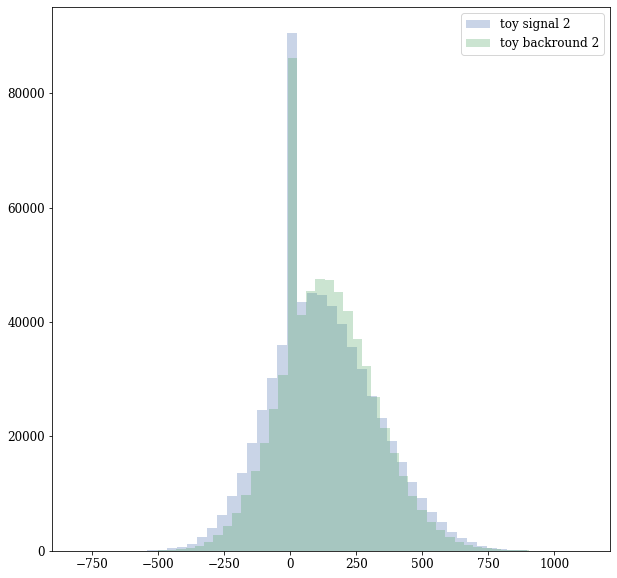

In [177]:
plt.hist(sig_mvn2.ravel(), bins=50, alpha=0.3, label='toy signal 2')
plt.hist(bkg_mvn2.ravel(), bins=50, alpha=0.3, label='toy backround 2')
plt.legend()
plt.show()

In [178]:
sig_mvn2 = np.hstack((sig_mvn2,np.ones((sig_mvn2.shape[0],1))))


bkg_mvn2 = np.hstack((bkg_mvn2,np.zeros((bkg_mvn2.shape[0],1))))


In [179]:
X_toy2 = np.vstack((sig_mvn2, bkg_mvn2))
X_toy2

array([[ 3.08038411e+00,  9.97005952e+01, -4.82162167e+01, ...,
         2.07650901e+01,  1.86954493e+01,  1.00000000e+00],
       [ 3.67863414e+00, -1.37215184e+01,  1.54067569e+02, ...,
         6.93044251e+01,  6.90269715e+01,  1.00000000e+00],
       [ 1.71163361e+00,  3.63871323e+01, -3.19250164e+01, ...,
        -1.33451746e+02, -1.29473517e+02,  1.00000000e+00],
       ...,
       [ 2.95001825e+00,  2.07004522e+02,  1.92633904e+02, ...,
        -1.90525305e+01,  1.95791049e+02,  0.00000000e+00],
       [-1.48302931e-02,  4.18192397e+02, -1.05222432e+02, ...,
        -8.80347596e+01,  1.00718123e+02,  0.00000000e+00],
       [ 4.79413282e+00,  7.46248982e+01,  6.52721017e+01, ...,
         2.22155290e+02, -4.00510431e+01,  0.00000000e+00]])

In [180]:
y_toy2 = X_toy2[:,-1]

y_toy2

array([1., 1., 1., ..., 0., 0., 0.])

In [181]:
X_toy2[:,-1] #check the last column

array([1., 1., 1., ..., 0., 0., 0.])

In [182]:
X_toy2 = X_toy2[:, :-1]

X_toy2[:,-1]

array([  18.69544929,   69.02697151, -129.47351692, ...,  195.791049  ,
        100.71812285,  -40.05104311])

In [183]:
n_samples, n_features = X_toy2.shape
n_samples, n_features

(100000, 13)

In [184]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
ntargets = 1
train_data, test_data, train_targets, test_targets = train_test_split(X_toy2, 
                                                                      y_toy2, 
                                                                      stratify=y_toy2)
#Reshape the targets to have shape (something, 1)
train_targets = train_targets.reshape(-1,1)
test_targets = test_targets.reshape(-1,1)
test_targets

array([[0.],
       [1.],
       [0.],
       ...,
       [1.],
       [0.],
       [1.]])

In [185]:
train_dataset = CustomDataset(train_data, train_targets)
test_dataset = CustomDataset(test_data, test_targets)



train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=10, 
                                           num_workers=2, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(test_dataset, 
                                          batch_size=10, num_workers=2)


### Now Train and hyperparameter-optimize!

In [239]:
filepath = "MLP_Tuned_toy_data_2.pt"

def perform_training(params, save_model=False):
    """Trains the model in a number of specified epochs and returns the best loss.
    the model hyperparameters are defined using the params dictionary, to be easily tuned later"""
    xtrain = train_data;  xtest = test_data
    ytrain = train_targets;  ytest = test_targets

    model =  Model(nfeatures=xtrain.shape[1], 
                ntargets=1,
                nlayers=params["num_layers"], 
                hidden_size=params["hidden_size"], 
                dropout=params["dropout"])

    optimizer = torch.optim.Adam(model.parameters(), lr = params["learning_rate"])

    eng = Engine(model=model, optimizer = optimizer)
    best_loss = np.inf
    early_stopping_iter = 10
    early_stopping_counter = 0
    EPOCHS=22

    for epoch in range(EPOCHS):
        train_loss = eng.train(train_loader)
        test_loss = eng.train(test_loader)
        print("Epoch : %-10g, Training Loss: %-10g, Test Loss: %-10g" % (epoch, train_loss, test_loss))
        #print(f"{epoch}, {train_loss}, {test_loss}")
        if test_loss < best_loss:
            best_loss = test_loss
            if save_model:
                #save model here
                torch.save(model, filepath) #OR
                #torch.save(model.state_dict(), filepath)
            
        else:
            early_stopping_counter += 1
        
        if early_stopping_counter > early_stopping_iter:
            #if we are not improving for 10 iterations then break the loop
            break
        
    return best_loss

def objective(trial):
    #define your parameters (that you want to tune) dictionary. Everytime the trial is called, these parameters are created
    #the name of the value could be the same as the key or different. Then the ranges
    params = {"num_layers": trial.suggest_int("num_layers", 1, 9),
              "hidden_size": trial.suggest_int("hidden_size", 16, 2048),
              "dropout": trial.suggest_uniform("dropout", 0.1, 0.7), #suggest a value for dropout from a uniform distribution, could be suggest_float
                "learning_rate": trial.suggest_uniform("learning_rate", 1e-6, 1e-3)
             }
    
    all_losses = [] #list of all losses from different folds
    temp_loss = perform_training(params, save_model=True)
    all_losses.append(temp_loss)
    
    return np.mean(all_losses)
    

study = optuna.create_study(direction="minimize")#define a direction; in this case we are minimizing the loss
study.optimize(objective, n_trials=6)

best_trial = study.best_trial
print(best_trial.values)
print(best_trial.params)

score = perform_training(params=best_trial.params, save_model=True)
print(score)

[I 2021-06-10 03:42:08,188] A new study created in memory with name: no-name-ecd21859-3680-48e8-8a12-49d36e4bec0e


Epoch : 0         , Training Loss: 8.85308e-05, Test Loss: 0.000243483
Epoch : 1         , Training Loss: 7.67814e-05, Test Loss: 0.00021219
Epoch : 2         , Training Loss: 8.23805e-05, Test Loss: 0.000187543
Epoch : 3         , Training Loss: 6.74971e-05, Test Loss: 0.000188957
Epoch : 4         , Training Loss: 0.000105086, Test Loss: 0.000188576
Epoch : 5         , Training Loss: 8.44658e-05, Test Loss: 0.000186466
Epoch : 6         , Training Loss: 6.65146e-05, Test Loss: 0.000186263
Epoch : 7         , Training Loss: 6.29139e-05, Test Loss: 0.00018676
Epoch : 8         , Training Loss: 7.33319e-05, Test Loss: 0.000186237
Epoch : 9         , Training Loss: 7.75129e-05, Test Loss: 0.000186153
Epoch : 10        , Training Loss: 9.92129e-05, Test Loss: 0.000189805
Epoch : 11        , Training Loss: 6.38286e-05, Test Loss: 0.000186587
Epoch : 12        , Training Loss: 8.33774e-05, Test Loss: 0.000187401
Epoch : 13        , Training Loss: 7.72508e-05, Test Loss: 0.000188113
Epoch : 

[I 2021-06-10 03:42:35,977] Trial 0 finished with value: 0.0001861525297164917 and parameters: {'num_layers': 6, 'hidden_size': 1706, 'dropout': 0.3047656352653427, 'learning_rate': 0.0007616898371526}. Best is trial 0 with value: 0.0001861525297164917.


Epoch : 17        , Training Loss: 6.20912e-05, Test Loss: 0.000186954
Epoch : 0         , Training Loss: 9.66239e-05, Test Loss: 0.000273117
Epoch : 1         , Training Loss: 0.000107324, Test Loss: 0.000259903
Epoch : 2         , Training Loss: 8.72511e-05, Test Loss: 0.000236104
Epoch : 3         , Training Loss: 9.31463e-05, Test Loss: 0.000226791
Epoch : 4         , Training Loss: 0.000106111, Test Loss: 0.000213041
Epoch : 5         , Training Loss: 8.62362e-05, Test Loss: 0.00019447
Epoch : 6         , Training Loss: 8.34303e-05, Test Loss: 0.000193234
Epoch : 7         , Training Loss: 6.55341e-05, Test Loss: 0.000190331
Epoch : 8         , Training Loss: 6.14531e-05, Test Loss: 0.000188394
Epoch : 9         , Training Loss: 8.52433e-05, Test Loss: 0.000187212
Epoch : 10        , Training Loss: 6.35825e-05, Test Loss: 0.000187294
Epoch : 11        , Training Loss: 6.76794e-05, Test Loss: 0.000186922
Epoch : 12        , Training Loss: 7.48632e-05, Test Loss: 0.000186679
Epoch :

[I 2021-06-10 03:43:22,720] Trial 1 finished with value: 0.00018641353845596313 and parameters: {'num_layers': 8, 'hidden_size': 1810, 'dropout': 0.1993642685986037, 'learning_rate': 0.0001874736312882728}. Best is trial 0 with value: 0.0001861525297164917.


Epoch : 21        , Training Loss: 6.28177e-05, Test Loss: 0.000186965
Epoch : 0         , Training Loss: 0.000108986, Test Loss: 0.000276123
Epoch : 1         , Training Loss: 9.09979e-05, Test Loss: 0.000256725
Epoch : 2         , Training Loss: 0.000112186, Test Loss: 0.000247326
Epoch : 3         , Training Loss: 0.000110184, Test Loss: 0.000270731
Epoch : 4         , Training Loss: 0.000101141, Test Loss: 0.000273197
Epoch : 5         , Training Loss: 7.58426e-05, Test Loss: 0.000274246
Epoch : 6         , Training Loss: 0.000100486, Test Loss: 0.000283028
Epoch : 7         , Training Loss: 9.02296e-05, Test Loss: 0.000262121
Epoch : 8         , Training Loss: 9.81634e-05, Test Loss: 0.000270319
Epoch : 9         , Training Loss: 0.000110972, Test Loss: 0.000269729
Epoch : 10        , Training Loss: 9.66392e-05, Test Loss: 0.000289366
Epoch : 11        , Training Loss: 7.61314e-05, Test Loss: 0.00028226
Epoch : 12        , Training Loss: 0.000102748, Test Loss: 0.000267209


[I 2021-06-10 03:43:32,373] Trial 2 finished with value: 0.00024732553958892823 and parameters: {'num_layers': 2, 'hidden_size': 26, 'dropout': 0.5620000840131602, 'learning_rate': 0.000513767787228854}. Best is trial 0 with value: 0.0001861525297164917.


Epoch : 13        , Training Loss: 9.39515e-05, Test Loss: 0.000278187
Epoch : 0         , Training Loss: 0.000114918, Test Loss: 0.000257065
Epoch : 1         , Training Loss: 9.43545e-05, Test Loss: 0.000268503
Epoch : 2         , Training Loss: 9.41151e-05, Test Loss: 0.000269989
Epoch : 3         , Training Loss: 7.32115e-05, Test Loss: 0.000268744
Epoch : 4         , Training Loss: 8.93336e-05, Test Loss: 0.00025982
Epoch : 5         , Training Loss: 0.000109169, Test Loss: 0.000260183
Epoch : 6         , Training Loss: 0.000100384, Test Loss: 0.000277014
Epoch : 7         , Training Loss: 7.64456e-05, Test Loss: 0.000280279
Epoch : 8         , Training Loss: 0.000110116, Test Loss: 0.000277239
Epoch : 9         , Training Loss: 0.000104377, Test Loss: 0.000255529
Epoch : 10        , Training Loss: 8.4215e-05, Test Loss: 0.000268109
Epoch : 11        , Training Loss: 0.000113118, Test Loss: 0.00026431


[I 2021-06-10 03:43:41,412] Trial 3 finished with value: 0.00025552923679351806 and parameters: {'num_layers': 5, 'hidden_size': 59, 'dropout': 0.5957703627290454, 'learning_rate': 0.00017484305841492515}. Best is trial 0 with value: 0.0001861525297164917.


Epoch : 12        , Training Loss: 0.000100141, Test Loss: 0.000274933
Epoch : 0         , Training Loss: 9.73817e-05, Test Loss: 0.000269759
Epoch : 1         , Training Loss: 7.44699e-05, Test Loss: 0.000277291
Epoch : 2         , Training Loss: 0.000108498, Test Loss: 0.000279844
Epoch : 3         , Training Loss: 0.00010672, Test Loss: 0.000269143
Epoch : 4         , Training Loss: 9.20638e-05, Test Loss: 0.000272746
Epoch : 5         , Training Loss: 0.000100637, Test Loss: 0.00026581
Epoch : 6         , Training Loss: 9.93108e-05, Test Loss: 0.000273865
Epoch : 7         , Training Loss: 9.96631e-05, Test Loss: 0.000267845
Epoch : 8         , Training Loss: 8.67181e-05, Test Loss: 0.000266299
Epoch : 9         , Training Loss: 0.000100541, Test Loss: 0.000279973
Epoch : 10        , Training Loss: 0.000109217, Test Loss: 0.000269749
Epoch : 11        , Training Loss: 9.21942e-05, Test Loss: 0.000263355
Epoch : 12        , Training Loss: 0.000103105, Test Loss: 0.000265487
Epoch : 

[I 2021-06-10 03:43:52,439] Trial 4 finished with value: 0.00025533366203308103 and parameters: {'num_layers': 1, 'hidden_size': 740, 'dropout': 0.5904193738700131, 'learning_rate': 0.00017776157628706797}. Best is trial 0 with value: 0.0001861525297164917.


Epoch : 15        , Training Loss: 0.000106431, Test Loss: 0.000255974
Epoch : 0         , Training Loss: 0.000100528, Test Loss: 0.000232597
Epoch : 1         , Training Loss: 7.34223e-05, Test Loss: 0.000188507
Epoch : 2         , Training Loss: 7.41597e-05, Test Loss: 0.000186597
Epoch : 3         , Training Loss: 8.91845e-05, Test Loss: 0.000186306
Epoch : 4         , Training Loss: 7.50068e-05, Test Loss: 0.000186373
Epoch : 5         , Training Loss: 6.72236e-05, Test Loss: 0.000186748
Epoch : 6         , Training Loss: 8.51201e-05, Test Loss: 0.000196239
Epoch : 7         , Training Loss: 7.4112e-05, Test Loss: 0.000189171
Epoch : 8         , Training Loss: 8.36501e-05, Test Loss: 0.000202237
Epoch : 9         , Training Loss: 7.85083e-05, Test Loss: 0.000190211
Epoch : 10        , Training Loss: 9.38135e-05, Test Loss: 0.000187004
Epoch : 11        , Training Loss: 8.06203e-05, Test Loss: 0.000186387
Epoch : 12        , Training Loss: 6.23104e-05, Test Loss: 0.000186205
Epoch :

[I 2021-06-10 03:44:21,968] Trial 5 finished with value: 0.00018613598346710206 and parameters: {'num_layers': 5, 'hidden_size': 1868, 'dropout': 0.1256379442058023, 'learning_rate': 0.0005289883044102198}. Best is trial 5 with value: 0.00018613598346710206.


Epoch : 19        , Training Loss: 7.23322e-05, Test Loss: 0.000186155
[0.00018613598346710206]
{'num_layers': 5, 'hidden_size': 1868, 'dropout': 0.1256379442058023, 'learning_rate': 0.0005289883044102198}
Epoch : 0         , Training Loss: 7.61691e-05, Test Loss: 0.000234858
Epoch : 1         , Training Loss: 8.58943e-05, Test Loss: 0.000188085
Epoch : 2         , Training Loss: 0.000100616, Test Loss: 0.000186906
Epoch : 3         , Training Loss: 0.00012959, Test Loss: 0.000186698
Epoch : 4         , Training Loss: 8.19388e-05, Test Loss: 0.000186772
Epoch : 5         , Training Loss: 8.42968e-05, Test Loss: 0.000187105
Epoch : 6         , Training Loss: 0.000130122, Test Loss: 0.000186854
Epoch : 7         , Training Loss: 0.000101335, Test Loss: 0.000188456
Epoch : 8         , Training Loss: 6.06514e-05, Test Loss: 0.000189735
Epoch : 9         , Training Loss: 6.72023e-05, Test Loss: 0.000189947
Epoch : 10        , Training Loss: 6.2909e-05, Test Loss: 0.000187928
Epoch : 11     

In [240]:
filepath = "MLP_Tuned_toy_data_2.pt"

toy_model = torch.load(filepath) 
#toy_model.load_state_dict(toy_model)
toy_model.eval()

Model(
  (model): Sequential(
    (0): Linear(in_features=13, out_features=1868, bias=True)
    (1): BatchNorm1d(1868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.1256379442058023, inplace=False)
    (3): ReLU()
    (4): Linear(in_features=1868, out_features=1868, bias=True)
    (5): BatchNorm1d(1868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.1256379442058023, inplace=False)
    (7): ReLU()
    (8): Linear(in_features=1868, out_features=1868, bias=True)
    (9): BatchNorm1d(1868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Dropout(p=0.1256379442058023, inplace=False)
    (11): ReLU()
    (12): Linear(in_features=1868, out_features=1868, bias=True)
    (13): BatchNorm1d(1868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): Dropout(p=0.1256379442058023, inplace=False)
    (15): ReLU()
    (16): Linear(in_features=1868, out_features=1868, bias=True)
 

In [241]:
outputs = []
labels = []
accuracies = []

#evaluate
with torch.no_grad():
    for data in test_loader:
        data_cp = copy.deepcopy(data)
        
        xtest = data_cp["x"]
        ytest = data_cp["y"]
        output = toy_model(xtest)
        labels.append(ytest)
        outputs.append(output)
        
        y_predicted_cls = output.round()
        acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])#bumber of correct predictions/sizeofytest
        #accuracies.append(acc.numpy())
        #print(f'accuracy: {acc.item():.4f}')
        
        del data_cp

#     acc = y_predicted_cls.eq(ytest).sum() / float(ytest.shape[0])
#     print(f'accuracy: {acc.item():.4f}')

In [242]:
OUTPUTS = torch.cat(outputs).view(-1).numpy()#concatenate everything
LABELS = torch.cat(labels).view(-1).numpy()
OUTPUTS, LABELS

(array([5.3280346e-06, 9.9995208e-01, 4.9210350e-08, ..., 9.9798143e-01,
        1.5576722e-07, 9.9997842e-01], dtype=float32),
 array([0., 1., 0., ..., 1., 0., 1.], dtype=float32))

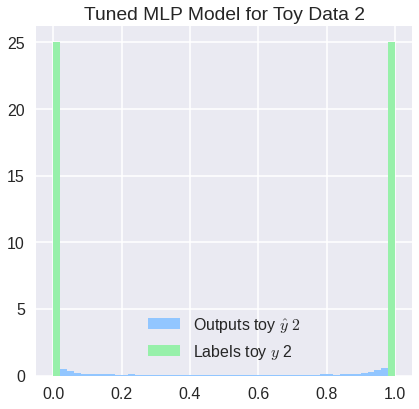

In [243]:
plt.rcParams["figure.figsize"] = (6,6)
plt.title("Tuned MLP Model for Toy Data 2")
plt.hist(OUTPUTS, bins=50, density=True, label = "Outputs toy $\hat{y} \ 2$")
plt.hist(LABELS, bins=50,density=True, label = "Labels toy $y$ 2")
plt.legend()
plt.show()

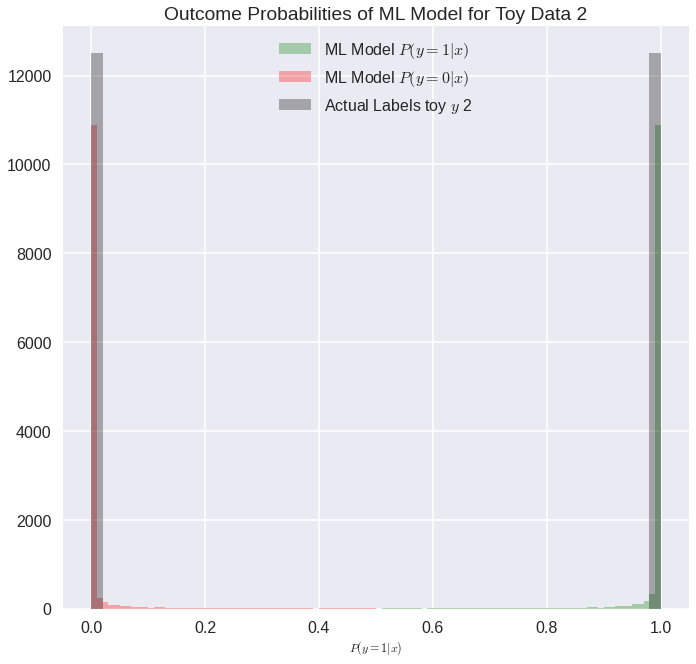

In [245]:
p_toy = compute_prob(toy_model, test_data)

plt.rcParams["figure.figsize"] = (10,10)
plt.hist(p_toy[p_toy>0.5], bins=50, color='g',
            histtype='stepfilled',
            alpha=0.3,label = 'ML Model $P(y= 1|x)$')

plt.hist(p_toy[p_toy<0.5], bins=50, color='r',
            histtype='stepfilled',
            alpha=0.3,label = 'ML Model $P(y= 0|x) $')

plt.hist(LABELS, bins=50, alpha=0.3, label = "Actual Labels toy $y$ 2", color='black')

plt.xlabel('$P(y=1|x)$', fontsize=FONTSIZE)
plt.title('Outcome Probabilities of ML Model for Toy Data 2')
plt.legend(loc='best')

### Wow!!

In [246]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# calculate scores
auc = roc_auc_score(LABELS, OUTPUTS)

print(' ROC AUC=%.3f' % (auc))

 ROC AUC=0.979


Avoid division by 0 in ratio

In [249]:
ratio = np.divide(p_toy, 1-p_toy, where= p_toy != 1)
ratio

array([5.3280628e-06, 2.0866184e+04, 4.9210353e-08, ..., 4.9439999e+02,
       1.5576725e-07, 4.6344902e+04], dtype=float32)

In [260]:
ratio = p_toy/(1-p_toy)
ratio

array([5.3280628e-06, 2.0866184e+04, 4.9210353e-08, ..., 4.9439999e+02,
       1.5576725e-07, 4.6344902e+04], dtype=float32)

In [261]:
ratio = p_toy/(1-p_toy)
#ratio = OUTPUTS/(1-OUTPUTS)

#np.seterr(divide='ignore', invalid='ignore')
print(ratio.shape)
np.isfinite(ratio.all())#check if there are any infinities in the ratio

(25000,)


True

In [262]:
sig = io[io[:, -1] > 0.5]
bkg = io[io[:, -1] < 0.5]

alpha_sig = sig[:p_toy.shape[0],1]

alpha_bkg = bkg[:p_toy.shape[0],1]

print(alpha_bkg.shape)

(25000,)


In [263]:
alpha_sig_inferred = alpha_bkg * ratio
np.isfinite(alpha_sig_inferred.all())

True

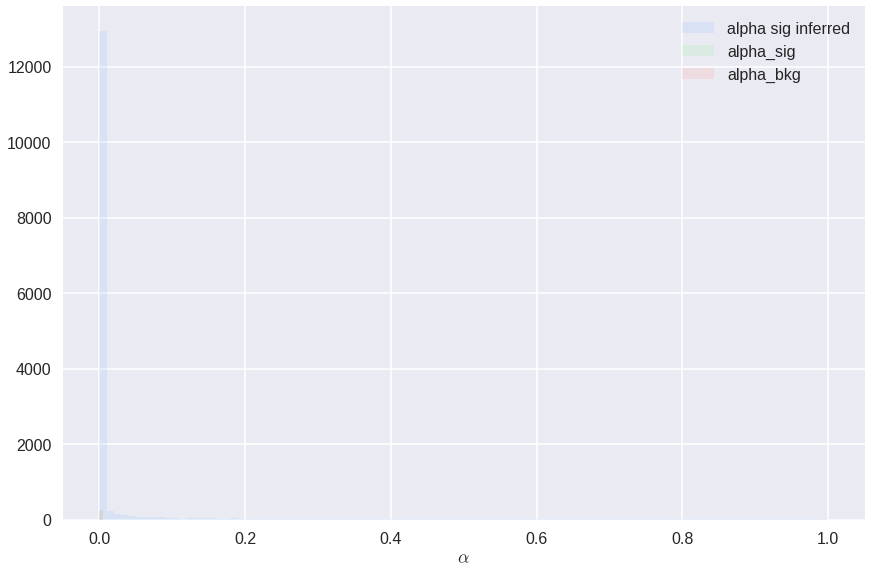

In [264]:

plt.hist(alpha_sig_inferred, bins=100, alpha=0.2, label = 'alpha sig inferred', range=(4.4480200751647233e-29, 1))
plt.hist(alpha_sig, bins=100, alpha=0.2, label='alpha_sig')

plt.hist(alpha_bkg, bins=100, alpha=0.2, label='alpha_bkg')
plt.xlabel(r'$\alpha$')
plt.legend()

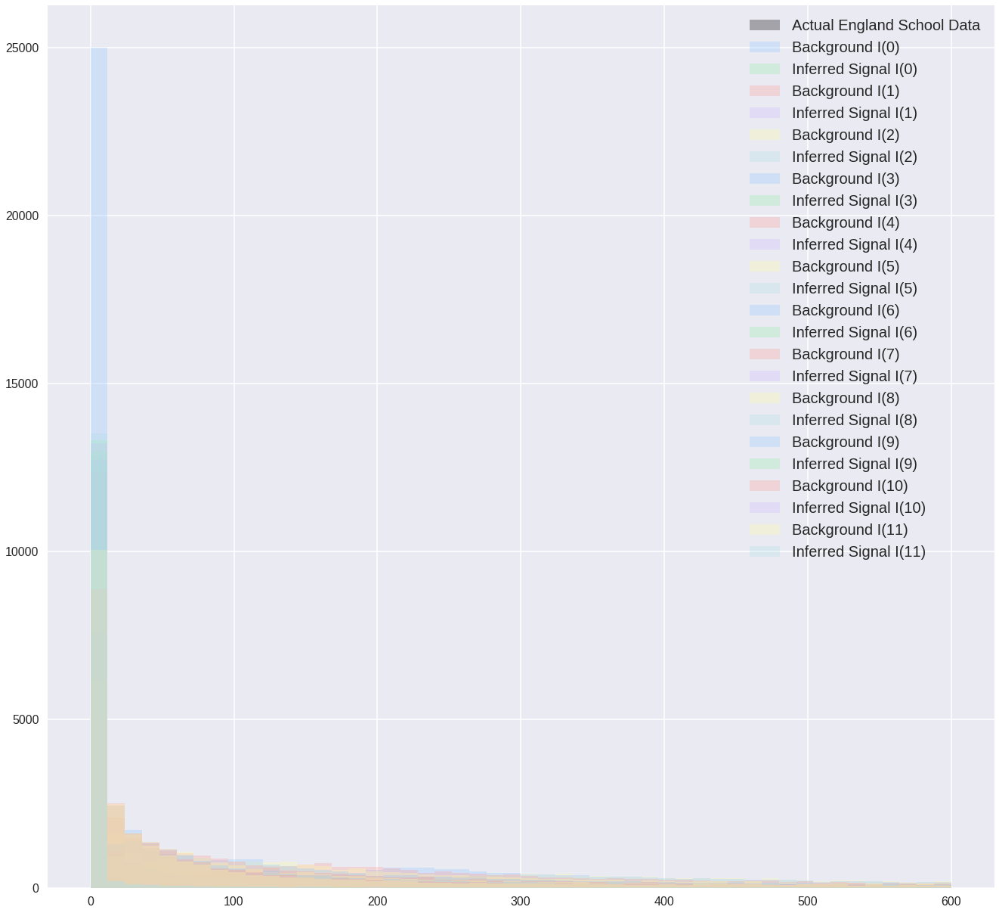

In [255]:
plt.style.use('seaborn-poster')
ydata0 = np.array([3, 25, 75, 227, 296, 258, 236, 192, 126, 71, 28, 11, 7])
plt.figure(figsize=(20, 20))

plt.hist(ydata0, bins=50, alpha=0.3, label='Actual England School Data', color='black')

for i in range(0,12):
    #plt.hist(sig[:p_toy.shape[0],2+i], label='Signal I('+str(i)+')', bins=50, alpha=0.3)
    plt.hist(bkg[:p_toy.shape[0],2+i], label='Background I('+str(i)+')', bins=50, alpha=0.3, range=(0,600))
    plt.hist(bkg[:p_toy.shape[0],2+i] * ratio, label='Inferred Signal I('+str(i)+')', bins=50, alpha=0.3, range=(0,600))
plt.legend(loc='best', fontsize=20)

It looks like this method works! Let's reduce it to one array of the means of each of the inferred counts

In [265]:
Inferred_I=[]
Inferred_I_means = []
for i in range(0,13):
    Inferred_I.append(bkg[:p_toy.shape[0],2+i] * ratio)
    Inferred_I_means.append((bkg[:p_toy.shape[0],2+i] * ratio).mean())
Inferred_I

[array([3.72964396e-05, 4.17323672e+04, 1.47631059e-07, ...,
        2.47199997e+03, 6.23069013e-07, 1.39034707e+05]),
 array([2.45090889e-04, 3.86024396e+06, 4.92103531e-06, ...,
        2.12591997e+04, 2.28977862e-05, 1.74720282e+07]),
 array([8.84458424e-04, 7.07363624e+06, 1.22533779e-05, ...,
        4.59791994e+04, 4.85993830e-05, 2.19211388e+07]),
 array([2.12589706e-03, 4.59056039e+06, 1.12691709e-05, ...,
        1.02340799e+05, 5.91915563e-05, 1.75647180e+07]),
 array([2.78657684e-03, 4.00630725e+06, 6.29892520e-06, ...,
        1.70567998e+05, 3.20880542e-05, 1.26985032e+07]),
 array([3.10626061e-03, 1.73189324e+06, 3.19867295e-06, ...,
        1.68590398e+05, 2.55458295e-05, 9.87146420e+06]),
 array([2.83985747e-03, 1.12677391e+06, 2.41130730e-06, ...,
        1.73534398e+05, 1.41748201e-05, 6.90539045e+06]),
 array([2.72264009e-03, 7.09450242e+05, 9.34996709e-07, ...,
        1.42881598e+05, 9.65756971e-06, 5.56138828e+06]),
 array([2.27508281e-03, 3.12992754e+05, 2.952621

In [267]:
Inferred_I[0].mean(), Inferred_I[4].mean(), Inferred_I_means

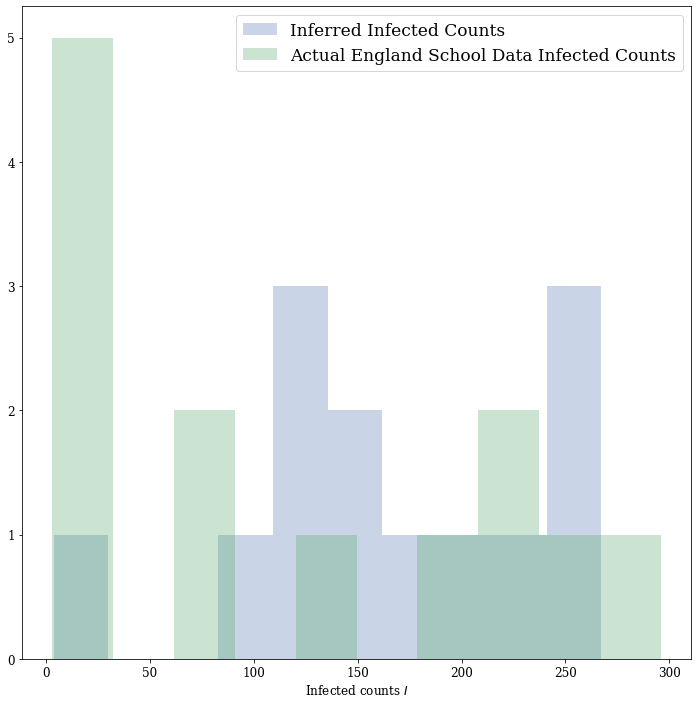

In [ ]:
plt.figure(figsize=(12,12))
plt.hist(Inferred_I_means, label='Inferred Infected Mean Counts', alpha=0.3, bins=10)
plt.hist(ydata0, label='Actual England School Data Infected Counts', alpha=0.3, bins=10)
plt.xlabel(r'Infected counts $I$')
plt.legend(fontsize=17)

_______________________________
## Next Steps and questions

It seems that this method really works for the SIR case, if we regard the infected counts as a Gaussian process with the apropriate covariances and means.  

#### Questions: 
* How can we adequetly compare our denisty of the infected counts to the true infected counts? As far as I know, the only "true" data that we should compare to is the one 13-count list of the England school data

tdata0 = np.array([1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]) -1 

ydata0 = np.array([3, 25, 75, 227, 296, 258, 236, 192, 126, 71, 28, 11, 7])

This is only one list! Should we just reduce our final density for the counts to a 13-count list? The "signal" i.e. the infected counts densities evaluated with the stochastic method is only an approximation of the real density, so it does not make sense to compare to it.

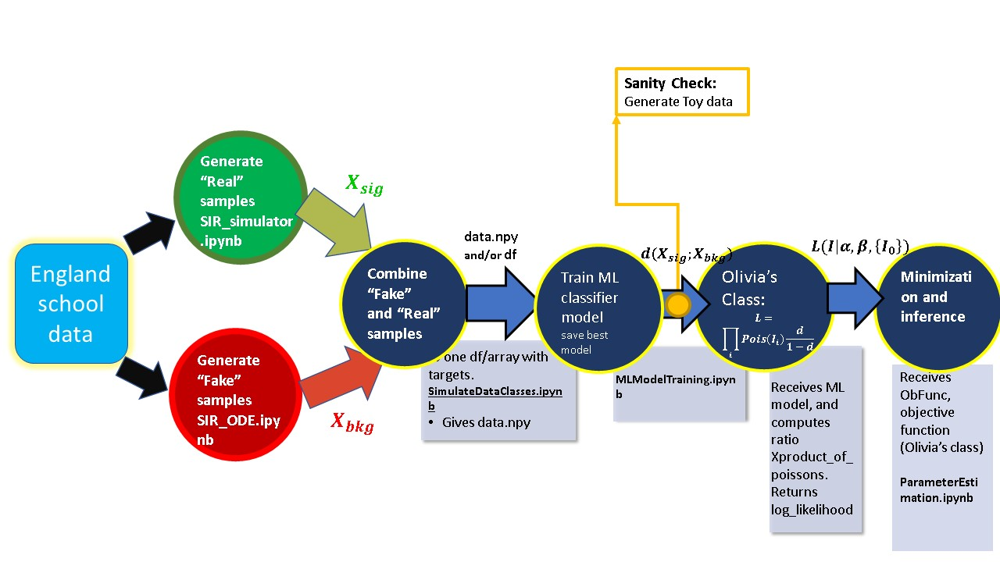

Next step is having Olivia's code, which receives my ML model, and calculates the likelihood as the product of Poissons of infected count means times the ratio d/(1-d). The likelihood will be a function of the parameters $\alpha$ and $\beta$.

You can run the notebook with the command '% run SIRLikelihood/ML_Model_Training.ipynb' from a different notebook, and you will have access to everything in this notebook from a different notebook. You can also load a particular (tuned) model from a different notebook and use it with the instructions provided above.

After that, my notebook for parameter estimation will receive Olivia's likelihood, and calculates the confidence intervals for $\alpha$ and $\beta$ and their conficence ellipses (by replacing them with their conditional maximum likelihood estimates and minimizing).